In [1]:
here::i_am("rna/trajectories/infer_trajectory.R")

suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(destiny))

# Load default settings
source(here::here("settings.R"))
source(here::here("utils.R"))

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/code

Warning message:
“package ‘destiny’ was built under R version 4.1.3”


# build_global_GRN_metacells

In [162]:
here::i_am("rna_atac/gene_regulatory_networks/metacells/build_global_GRN_metacells.R")

source(here::here("settings.R"))
source(here::here("utils.R"))

library(cowplot)

#####################
## Define settings ##
#####################

# I/O
io$sce <- file.path(io$basedir, 'results/rna/metacells/all_cells/SingleCellExperiment_metacells.rds')
io$outdir <-  file.path(io$basedir,"results/rna_atac/gene_regulatory_networks/metacells/all_cells"); dir.create(io$outdir, showWarnings = F, recursive = T)
# io$chip_GRN.df <- file.path(io$outdir,'chip_GRN_df.csv')
io$tf2gene_virtual_chip <- file.path(io$basedir,"results/rna_atac/virtual_chipseq/metacells/CISBP/TF2gene_after_virtual_chip.txt.gz")
# Options
# opts$celltypes <- setdiff(opts$celltypes, c("ExE_endoderm","ExE_ectoderm","Parietal_endoderm"))
opts$min_chip_score <- 0.15
opts$max_distance <- 1e5
opts$ncores <- 4

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/code



In [163]:
test =fread(io$tf2gene_virtual_chip) %>%
  .[chip_score>=opts$min_chip_score & dist<=opts$max_distance] %>% 
  .[,c("tf","gene")] %>% unique # Only keep TF-gene links

In [164]:
length(unique(test$tf))

[1] 563

In [165]:
####################################################
## Load TF2gene links based on in silico ChIP-seq ##
####################################################

tf2gene_chip.dt <- fread(io$tf2gene_virtual_chip) %>%
  .[chip_score>=opts$min_chip_score & dist<=opts$max_distance] %>% 
  .[,c("tf","gene")] %>% unique # Only keep TF-gene links

##############################
## Load RNA expression data ##
##############################

sce <- readRDS(io$sce)

# (Optional) restrict to marker genes
# marker_genes.dt <- fread(io$rna.atlas.marker_genes)
# sce <- sce[rownames(sce)%in%unique(marker_genes.dt$gene),]

##########################
## Filter TFs and genes ##
##########################

TFs <- intersect(unique(tf2gene_chip.dt$tf),toupper(rownames(sce)))
genes <- intersect(unique(tf2gene_chip.dt$gene),rownames(sce))

tf2gene_chip.dt <- tf2gene_chip.dt[tf%in%TFs & gene%in%genes,]

# Fetch RNA expression matrices
rna_tf.mtx <- logcounts(sce)[str_to_title(unique(tf2gene_chip.dt$tf)),]; rownames(rna_tf.mtx) <- toupper(rownames(rna_tf.mtx))
rna_targets.mtx <- logcounts(sce)[unique(tf2gene_chip.dt$gene),]

# TO-DO: FILTER OUT LOWLY VARIABLE GENES
rna_tf.mtx <- rna_tf.mtx[apply(rna_tf.mtx,1,var)>=0.5,]
rna_targets.mtx <- rna_targets.mtx[apply(rna_targets.mtx,1,var)>=1,]

TFs <- intersect(unique(tf2gene_chip.dt$tf),rownames(rna_tf.mtx))
genes <- intersect(unique(tf2gene_chip.dt$gene),rownames(rna_targets.mtx))
tf2gene_chip.dt <- tf2gene_chip.dt[tf%in%TFs & gene%in%genes,]


In [166]:
length(unique(tf2gene_chip.dt$tf))

[1] 495

In [167]:
####################
## run regression ##
####################

# cvfit <- cv.glmnet(x, y, alpha=0)
# opt_ridge <- glmnet(x, y, alpha = 0, lambda  = cvfit$lambda.min)
# df <- data.frame(tf=rownames(opt_ridge$beta), gene=i, beta=as.matrix(opt_ridge$beta)[,1])

# length(genes_split); sapply(genes_split,length)

  tmp <- tf2gene_chip.dt
GRN_coef.dt = genes %>% map(function(i) {
    # print(sprintf("%s (%d/%d)",i,match(i,genes),length(genes)))
    tfs <- tmp[gene==i,tf]
    tfs %>% map(function(j) {
      x <- rna_tf.mtx[j,]
      y <- rna_targets.mtx[i,]
      lm.fit <- lm(y~x)
      data.frame(tf=j, gene=i, beta=round(coef(lm.fit)[[2]],3), pvalue=format(summary(lm.fit)$coefficients[2,4], digits=3))
    }) %>% rbindlist
  }) %>% rbindlist

# save
fwrite(GRN_coef.dt, file.path(io$outdir,'global_chip_GRN_coef.txt.gz'), sep="\t")


Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be unreliable”
Warning message in summary.lm(lm.fit):
“essentially perfect fit: summary may be 

# plot_GRN_metacells_nmp_trajectory

In [168]:
suppressMessages(library(GGally))
suppressMessages(library(igraph))
suppressMessages(library(network))
suppressMessages(library(sna))
# suppressMessages(library(intergraph))
suppressMessages(library(ggraph))
suppressMessages(library(igraph))
suppressMessages(library(tibble))
suppressMessages(library(tidygraph))

In [169]:
args$outdir = io$outdir

In [170]:
#####################
## Define settings ##
#####################

# args$rna_cells.sce <- io$rna.sce
io$rna_metacells.sce <- file.path(io$basedir, 'results/rna/metacells/all_cells/SingleCellExperiment_metacells.rds')
io$rna_pseudobulk.sce <- file.path(io$basedir,"results/rna/pseudobulk/celltype/SingleCellExperiment_pseudobulk.rds")
io$trajectory <- "all"
io$grn_coef <- file.path(args$outdir, 'global_chip_GRN_coef.txt.gz')
io$outdir = args$outdir
# Options
opts$min_coef <- 0.20
opts$min_tf_score <- 0.75

if (io$trajectory=="nmp") {
  celltypes.to.plot <- c("Caudal_Mesoderm", "Somitic_mesoderm", "NMP", "Spinal_cord")
}
if (io$trajectory=="epiblast_blood") {
  celltypes.to.plot <- c("Epiblast",
                        "Primitive_Streak" ,
                        "Nascent_mesoderm",
                        "ExE_mesoderm",
                        "Mixed_mesoderm",
                        "Allantois",
                        "Mesenchyme",
                        "Haematoendothelial_progenitors",
                        "Endothelium",
                        "Blood_progenitors_1",
                        "Blood_progenitors_2",
                        "Erythroid1",
                        "Erythroid2",
                        "Erythroid3")
}
if (io$trajectory=="all") {
  celltypes.to.plot <- opts$celltypes
}

theme_graph <- function() {
  theme_classic() +
    theme(
      axis.line = element_blank(), 
      axis.text = element_blank(),
      axis.ticks = element_blank(), 
      axis.title = element_blank(),
      legend.position = "none"
    )
}

In [171]:
##############################
## Load marker gene and TFs ##
##############################

# TFs <- fread(paste0(io$basedir,"/results/rna_atac/gene_regulatory_networks/TFs.txt"))[[1]]
marker_TFs_all.dt <- fread(io$rna.atlas.marker_TFs.all) %>% 
  .[celltype%in%celltypes.to.plot] %>%
  .[,gene:=toupper(gene)]

marker_TFs_filt.dt <- marker_TFs_all.dt %>% 
  .[score>=opts$min_tf_score]

print(unique(marker_TFs_filt.dt$gene))

#marker_TFs_all.dt <- marker_TFs_all.dt[celltype!="Caudal_Mesoderm"]

  [1] "BBX"     "ETV2"    "GATA4"   "GATA5"   "HAND1"   "HAND2"   "HOXA10" 
  [8] "HOXA11"  "HOXA7"   "HOXA9"   "HOXB6"   "HOXB7"   "HOXC10"  "HOXC6"  
 [15] "HOXC8"   "HOXC9"   "HOXD1"   "HOXD9"   "ISL1"    "KLF6"    "MSX1"   
 [22] "MSX2"    "PITX1"   "PITX2"   "PRRX1"   "PRRX2"   "SNAI1"   "TBX20"  
 [29] "TBX3"    "TBX4"    "TCF21"   "TWIST1"  "TWIST2"  "BCL11A"  "EOMES"  
 [36] "FOXA2"   "GATA6"   "GSC"     "HES1"    "HHEX"    "LHX1"    "MIXL1"  
 [43] "NANOG"   "OTX2"    "OVOL2"   "SOX17"   "SP5"     "ZIC5"    "ASCL2"  
 [50] "ETS1"    "ETS2"    "FLI1"    "GATA1"   "GATA2"   "GFI1B"   "HOXB5"  
 [57] "JUNB"    "KLF2"    "LYL1"    "RUNX1"   "TAL1"    "ZFP711"  "IKZF1"  
 [64] "KLF1"    "MYB"     "NFE2"    "STAT3"   "FOS"     "ID2"     "MEF2C"  
 [71] "MEIS1"   "NKX2-5"  "SRF"     "TBX5"    "CDX1"    "CDX2"    "CDX4"   
 [78] "ETV4"    "EVX1"    "FOXB1"   "GBX2"    "HES7"    "HOXA1"   "HOXA3"  
 [85] "HOXB1"   "HOXB4"   "HOXB8"   "HOXB9"   "HOXC4"   "NR6A1"   "RXRG"   
 [92] "T"   

In [172]:
# to use all markers:
marker_TFs_filt.dt = marker_TFs_all.dt

In [173]:
##############################
## Load RNA expression data ##
##############################

# SingleCellExperiment at cellular resolution
# rna_cells.sce <- readRDS(args$rna_cells.sce)[,trajectory.dt$cell]

# SingleCellExperiment at metacell resolution
rna_metacells.sce <- readRDS(io$rna_metacells.sce)

# SingleCellExperiment at pseudobulk resolution
rna_pseudobulk.sce <- readRDS(io$rna_pseudobulk.sce)#[,celltypes.to.plot]

In [174]:
##################################
## Load global GRN coefficients ##
##################################

GRN_coef.dt <- fread(io$grn_coef) %>% 
  .[,gene:=toupper(gene)] %>% #.[gene%in%unique(marker_TFs_filt.dt$gene) & tf%in%unique(marker_TFs_filt.dt$gene)] %>%
  .[pvalue<0.05& abs(beta)>=opts$min_coef]

In [175]:
##########################
## Filter TFs and genes ##
##########################

# Filter TFs that have few connections
# TFs <- intersect(GRN_coef.dt[,.N,by="tf"][N>=3,tf], GRN_coef.dt[,.N,by="gene"][N>=2,gene])
TFs <- GRN_coef.dt[,.N,by="tf"][N>=3,tf]
GRN_coef.dt <- GRN_coef.dt[tf%in%TFs & gene%in%TFs]

# Fetch RNA expression matrices
rna_tf_pseudobulk.mtx <- logcounts(rna_pseudobulk.sce)[str_to_title(TFs),]; rownames(rna_tf_pseudobulk.mtx) <- toupper(rownames(rna_tf_pseudobulk.mtx))
rna_tf_metacells.mtx <- logcounts(rna_metacells.sce)[str_to_title(TFs),]; rownames(rna_tf_metacells.mtx) <- toupper(rownames(rna_tf_metacells.mtx))

# Scale
# rna_tf_pseudobulk_scaled.mtx <- apply(rna_tf_pseudobulk.mtx,1,minmax.normalisation) %>% .[celltypes.to.plot,] %>% t 
rna_tf_pseudobulk_scaled.mtx <- apply(rna_tf_pseudobulk.mtx[,celltypes.to.plot],1,minmax.normalisation) %>% t 
rna_tf_metacells_scaled.mtx <- apply(rna_tf_metacells.mtx,1,minmax.normalisation) %>% t 

In [176]:
####################
## Create network ##
####################

# Create node and edge data.frames
TFs <- unique(c(GRN_coef.dt$tf,GRN_coef.dt$gene))
node_list.dt <- data.table(node_id=1:length(TFs), node_name=TFs)
edge_list.dt <- GRN_coef.dt[,c("tf","gene","beta")] %>% setnames(c("from","to","weight")) %>% .[!from==to]

# Create igraph object
igraph.net <- graph_from_data_frame(d = edge_list.dt)

# Create tbl_graph object for ggraph
igraph.tbl <- as_tbl_graph(igraph.net) %>%
  activate(nodes) %>%
  mutate(tf=names(V(igraph.net))) %>%
  mutate(degree=igraph::degree(igraph.net)) %>%
  mutate(eigen_centrality=eigen_centrality(igraph.net)$vector) %>%
  activate(edges) %>%
  mutate(sign=ifelse(E(igraph.net)$weight>0,"Positive","Negative")) %>%
  mutate(weight=abs(weight))

png 
  2

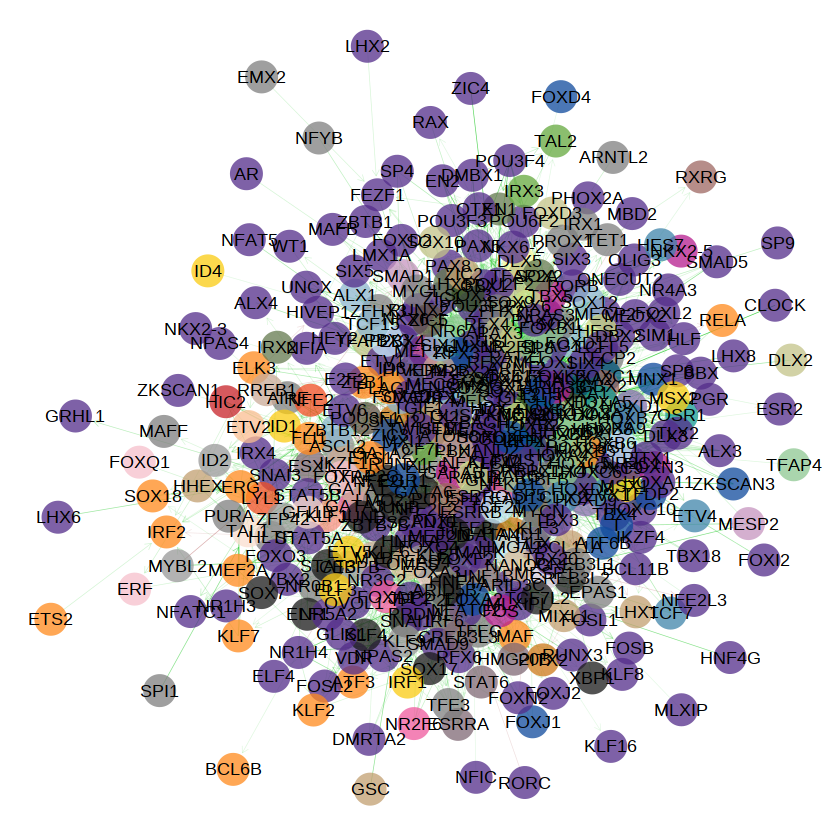

In [177]:
#########################
## Plot global network ##
#########################

# Define node color
tmp <- marker_TFs_all.dt[gene%in%names(V(igraph.net))] %>% .[,.SD[which.max(score)][,"celltype"],by="gene"] %>% setkey(gene)
igraph.tbl <- igraph.tbl %>% activate(nodes) %>% mutate(celltype=tmp[names(V(igraph.net)),celltype])

# Plot
set.seed(42)
p <- ggraph(igraph.tbl, 'lgl') +
  geom_edge_link(aes(edge_colour = sign, alpha=weight), edge_width=0.15, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm')) +
  geom_node_point(aes(fill=celltype), size=9, stroke=0, shape=21, alpha=0.75) +
  geom_node_text(aes(label=name), size=3.75) +
  scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
  scale_fill_manual(values=opts$celltype.colors) +
  theme_graph()

pdf(file.path(io$outdir,"global_network_celltype.pdf"), width = 10, height = 10)
print(p)
dev.off()
p

png 
  2

png 
  2

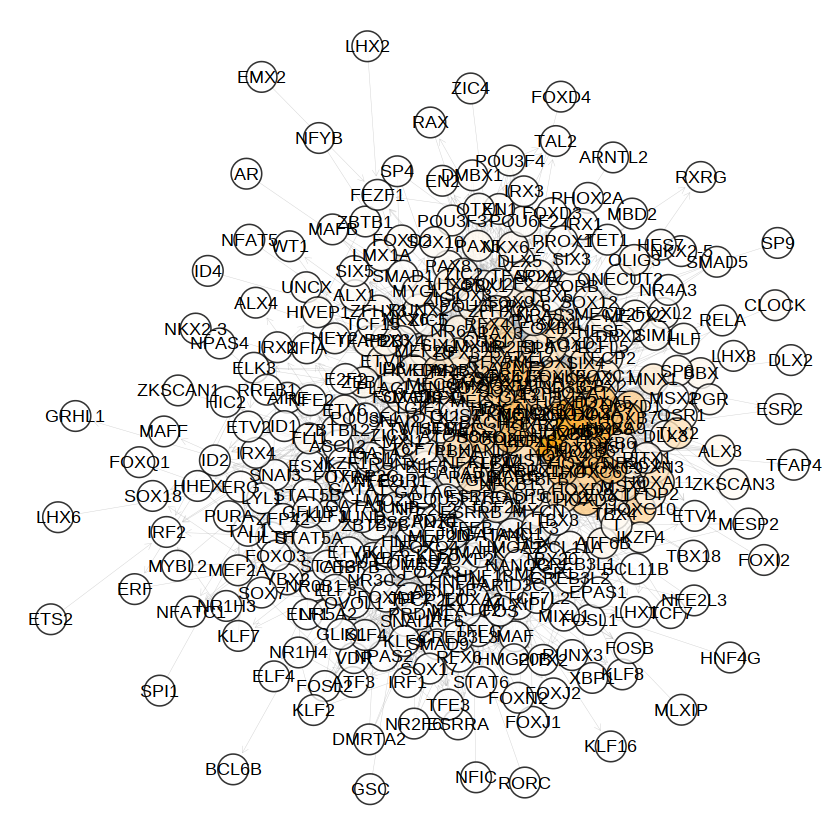

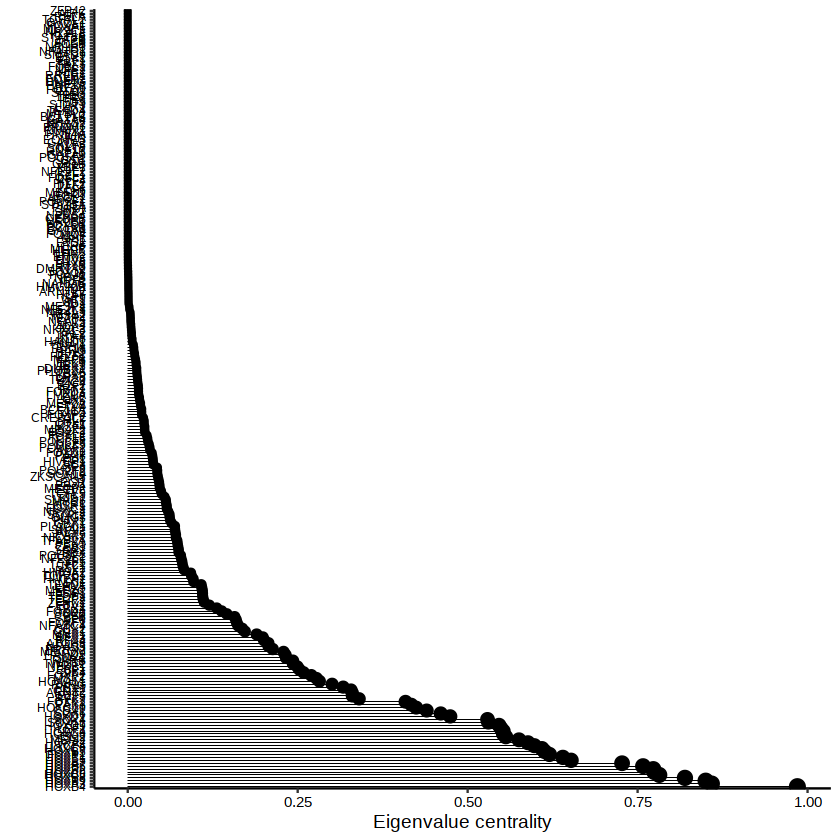

In [178]:
#################################################
## Plot global network, coloured by centrality ##
#################################################

set.seed(42)
p <- ggraph(igraph.tbl, 'lgl') +
  geom_edge_link(edge_colour = "grey66", edge_alpha=0.50, edge_width=0.10, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm')) +
  # geom_node_point(aes(fill=degree), size=8, shape=21) +
  geom_node_point(aes(fill=eigen_centrality), size=8, shape=21, alpha=0.80) +
  geom_node_text(aes(label=name), size=3.75) +
  scale_fill_gradient(low = "white", high = "orange") +
  theme_graph()

pdf(file.path(io$outdir,"global_network_eigen_centrality.pdf"), width = 10, height = 10)
print(p)
dev.off()
p

to.plot <- data.table(tf=names(V(igraph.net)), centrality = eigen_centrality(igraph.net)$vector) %>% 
  .[sample(x=.N, size=round(.N/1.5))] %>%
  setorder(-centrality) %>%
  .[,tf:=factor(tf, levels=tf)] 

# to.plot <- rbind(
#   eigen_centrality.dt %>% head(n=10),
#   eigen_centrality.dt %>% tail(n=10)
# )

p <- ggplot(to.plot, aes_string(x="centrality", y="tf")) +
  geom_point(aes(size=centrality)) +
  geom_segment(aes(yend=tf), xend=0, size=0.20) +
  scale_size_continuous(range = c(1.25,3.75)) +
  labs(y="", x="Eigenvalue centrality") +
  theme_classic() +
  guides(size="none") +
  theme(
    axis.text.x = element_text(size=rel(1.0), color="black"),
    axis.text.y = element_text(size=rel(0.75), color="black")
  )

pdf(file.path(io$outdir,"global_network_eigen_centrality_stats.pdf"), width = 10, height = 10)
print(p)
dev.off()
p

png 
  2

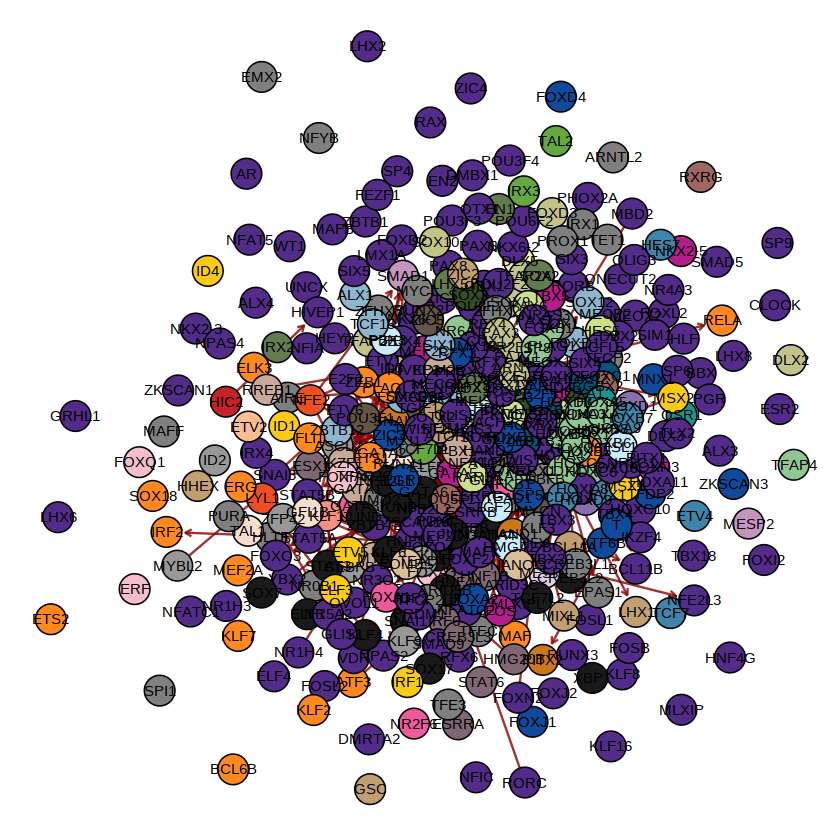

In [179]:
##################################
## Plot repressive interactions ##
##################################

set.seed(42)
p <- ggraph(igraph.tbl, 'lgl') +
  geom_edge_link(aes(edge_colour = sign, edge_alpha = sign), arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm')) +
  geom_node_point( aes(fill=celltype), size=8, shape=21) + #
  geom_node_text(aes(label=name), size=3) +
  scale_edge_alpha_manual(values=c("Positive"=0, "Negative"=0.80)) +
  scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
  scale_fill_manual(values=opts$celltype.colors) +
  theme_graph()

pdf(file.path(io$outdir,"global_network_repressive_interactions.pdf"), width = 25, height = 25)
print(p)
dev.off()
p

png 
  2

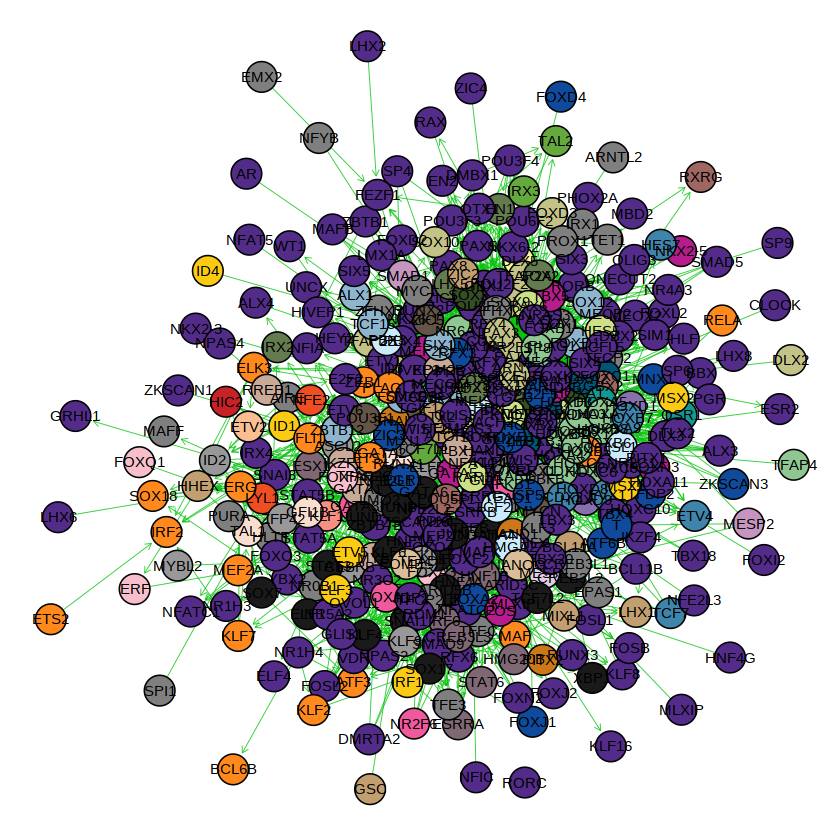

In [180]:
##################################
## Plot activatory interactions ##
##################################

set.seed(42)
p <- ggraph(igraph.tbl, 'lgl') +
  geom_edge_link(aes(edge_colour = sign, edge_alpha = sign), edge_width=0.20, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm')) +
  geom_node_point(aes(fill=celltype), size=8, shape=21) +
  geom_node_text(aes(label=name), size=3) +
  scale_edge_alpha_manual(values=c("Positive"=0.8, "Negative"=0)) +
  scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
  scale_fill_manual(values=opts$celltype.colors) +
  theme_graph()

pdf(file.path(io$outdir,"global_network_activatory_interactions.pdf"), width = 25, height = 25)
print(p)
dev.off()
p

In [187]:
TFs

[1] "ATF3"    "ESX1"    "FOXA3"   "FOXO4"   "FOXP2"   "GATA3"   "GLI1"   
  [8] "GLI2"    "GLI3"    "HOXA4"   "HOXB3"   "HOXC10"  "HOXC5"   "HOXC6"  
 [15] "HOXD9"   "KLF12"   "KLF5"    "MLXIPL"  "TEAD1"   "TFEB"    "TFEC"   
 [22] "AIRE"    "HLTF"    "ID1"     "ID2"     "ID3"     "SNAI3"   "ZBTB7B" 
 [29] "ARID3C"  "CEBPB"   "ELF5"    "ESRRA"   "GATA4"   "HNF1A"   "HNF1B"  
 [36] "HNF4A"   "HOXD3"   "MAF"     "NFATC2"  "OVOL1"   "RFX6"    "STAT6"  
 [43] "TEAD4"   "TFAP2C"  "VDR"     "ASCL2"   "ESRRB"   "FOSL1"   "FOXD1"  
 [50] "HAND1"   "HLX"     "HOXB2"   "HOXD4"   "HOXD8"   "IRX4"    "MEOX1"  
 [57] "MEOX2"   "NFE2"    "NFE2L2"  "NR0B1"   "NR2F2"   "PAX8"    "PRRX1"  
 [64] "PRRX2"   "SOX11"   "TCF7L1"  "ZIC1"    "ZSCAN10" "ELF1"    "GATA1"  
 [71] "IKZF1"   "KLF1"    "LMO2"    "LYL1"    "MYB"     "RUNX1"   "STAT3"  
 [78] "STAT5A"  "STAT5B"  "TAL1"    "TFDP2"   "GATA2"   "HOXA1"   "LEF1"   
 [85] "PATZ1"   "PLAG1"   "SOX4"    "TCF4"    "TGIF1"   "ZFP42"   "ARNT2"  
 [92] "BBX"     "CBFB"    "CUX1"    "EBF1"    "GBX1"    "HDX"     "HMGA2"  
 [99] "LHX5"    "MEIS2"   "MEIS3"   "MXI1"    "NR2F1"   "NR6A1"   "ONECUT2"
[106] "PKNOX2"  "RFX7"    "ZBTB12"  "ZFHX3"   "GATA6"   "NR3C2"   "ALX1"   
[113] "ATOH8"   "CDX1"    "CDX4"    "CREB3L2" "DLX5"    "ESRRG"   "EVX1"   
[120] "FOXD2"   "FOXF1"   "FOXF2"   "GATA5"   "HAND2"   "HES1"    "HEY2"   
[127] "HOXA9"   "HOXB1"   "HOXB4"   "HOXB6"   "HOXB8"   "HOXB9"   "LMX1B"  
[134] "MECP2"   "MEIS1"   "NFATC4"  "NFKB1"   "RARG"    "RORA"    "RORB"   
[141] "SOX1"    "SOX5"    "SOX6"    "TCF12"   "TCF21"   "TFAP2B"  "TFCP2"  
[148] "TWIST2"  "ARID3B"  "DBX2"    "E2F5"    "FOXA2"   "FOXB1"   "FOXC1"  
[155] "FOXI2"   "FOXP1"   "GBX2"    "HOXA2"   "HOXB5"   "HOXC8"   "MEF2C"  
[162] "MESP1"   "MSX1"    "MYCN"    "NFE2L1"  "NKX6-1"  "NR2C1"   "OSR1"   
[169] "PBX1"    "PDX1"    "PHOX2A"  "RARB"    "RFX3"    "RUNX2"   "SNAI2"  
[176] "SOX13"   "SOX9"    "TFAP2A"  "ZBTB1"   "ALX4"    "BACH2"   "ETV1"   
[183] "FOXC2"   "HIVEP2"  "KDM2B"   "NKX2-5"  "NPAS3"   "TBX5"    "UNCX"   
[190] "ZEB1"    "CDX2"    "FOXN3"   "HOXA11"  "HOXA3"   "HOXC9"   "HOXD1"  
[197] "FOXK2"   "FOXL2"   "FOXP4"   "HIVEP1"  "IKZF4"   "IRX5"    "ISL1"   
[204] "KLF6"    "KLF8"    "LHX8"    "POU3F2"  "SIX1"    "SIX4"    "SOX12"  
[211] "ALX3"    "DLX3"    "HOXA5"   "HOXA7"   "HOXB7"   "MNX1"    "TBX4"   
[218] "TLX2"    "ATF6B"   "AR"      "NFYB"    "RFX4"    "SOX3"    "SP8"    
[225] "ZIC2"    "ZIC3"    "DMBX1"   "EN2"     "HES5"    "IRF6"    "JUN"    
[232] "LMX1A"   "MAFB"    "NKX6-2"  "NR4A3"   "OLIG3"   "OTX2"    "PAX6"   
[239] "PBX4"    "POU2F2"  "POU3F3"  "POU3F4"  "POU6F2"  "SOX2"    "TCFL5"  
[246] "ZFHX2"   "ARID5B"  "EOMES"   "NFAT5"   "ELK3"    "ERG"     "FLI1"   
[253] "GFI1B"   "PBX3"    "TBX18"   "NKX2-3"  "FOXD3"   "NANOG"   "POU5F1" 
[260] "ZIC5"    "HHEX"    "SMAD1"   "MYCL"    "MEF2A"   "EN1"     "FOXD4"  
[267] "IRX1"    "PAX5"    "RAX"     "ZIC4"    "ID4"     "SP5"     "SP6"    
[274] "FOXA1"   "FOXJ1"   "LHX1"    "T"       "ZKSCAN3" "SMAD9"   "TAL2"   
[281] "OTX1"    "EMX2"    "LHX2"    "ARNTL2"  "HMG20B"  "MEF2D"   "NR1H4"  
[288] "NR2F6"   "YBX2"    "SP4"     "ETS1"    "ETV2"    "CLOCK"   "SNAI1"  
[295] "TWIST1"  "MSX2"    "BCL11A"  "ETV6"    "TET1"    "DMRTA2"  "FOSL2"  
[302] "FEZF1"   "NR5A2"   "TCF7"    "DLX2"    "KLF3"    "MIXL1"   "PAX7"   
[309] "PGR"     "PITX2"   "PRDM1"   "CREB3L3" "NPAS2"   "TFCP2L1" "TFE3"   
[316] "CREB3L1" "FOS"     "JUNB"    "JUND"    "HNF4G"   "SOX17"   "TCF7L2" 
[323] "FOXJ2"   "NFIC"    "PITX1"   "PURA"    "EPAS1"   "KLF4"    "RELA"   
[330] "ELF4"    "MYBL2"   "ERF"     "ETV5"    "KLF2"    "NR1H3"   "EGR1"   
[337] "RUNX3"   "PLAGL1"  "TBX20"   "WT1"     "ETV4"    "TFAP4"   "GLIS3"  
[344] "JDP2"    "SOX10"   "MAFK"    "RREB1"   "FOXN2"   "HIC2"    "BCL11B" 
[351] "SMAD3"   "SMAD5"   "MESP2"   "IRX3"    "NPAS4"   "RORC"    "SP9"    
[358] "XBP1"    "ZKSCAN1" "POU3F1"  "GSC"     "IRF1"    "ESR2"    "TCF15"  
[365] "NFE2L3"  "MLXIP"   "FOXO3"   "PAX2"    "ETS

png 
  2

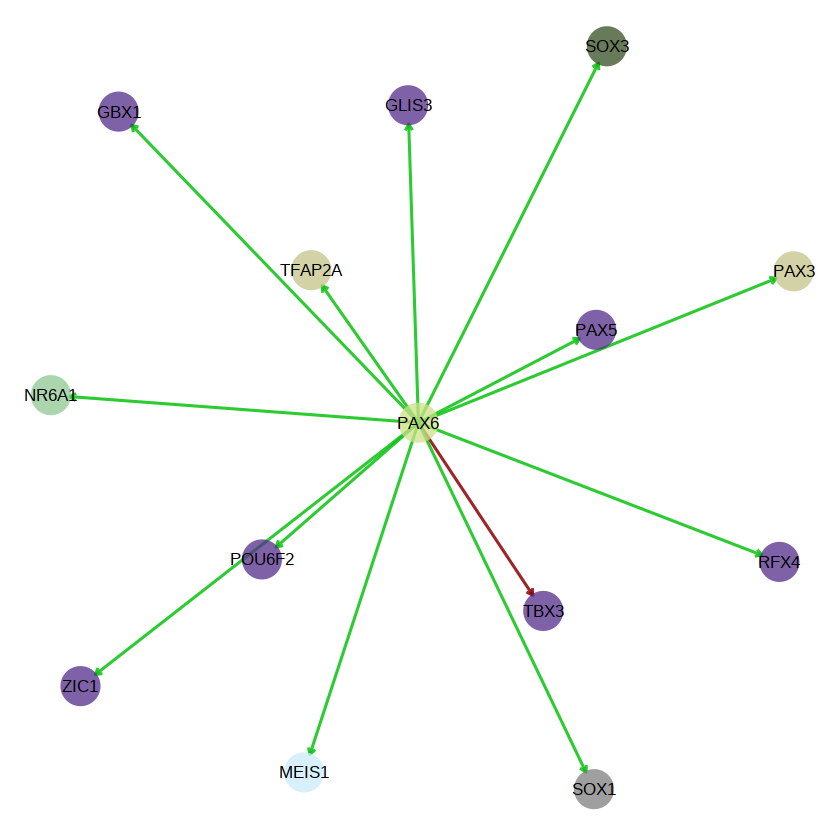

In [190]:
######################################################################################
## Highlight a TF with pleiotropy effects (both positive and negative interactions) ##
######################################################################################

TF_of_interest <- "PAX6"

idx <- which(names(V(igraph.net))==TF_of_interest)
test <- igraph.tbl %>% activate(edges) %>% filter(from==idx)

tmp <- names(V(igraph.net))[test %>% activate(edges) %>% as_tibble() %>% .$to]
test <- test %>% activate(nodes) %>% filter(name%in%c(TF_of_interest,tmp))

set.seed(42)
p <- ggraph(test, 'lgl') +
  geom_edge_link(aes(edge_colour = sign), edge_alpha=0.85, edge_width=0.65, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm')) +
  geom_node_point(aes(fill=celltype), size=11, shape=21, stroke=0, alpha=0.75) +
  geom_node_text(aes(label=name), size=3.5) +
  scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
  scale_fill_manual(values=opts$celltype.colors) +
  theme_graph()

pdf(file.path(io$outdir,sprintf("%s_network.pdf", TF_of_interest)), width = 4, height = 4)
print(p)
dev.off()
p

In [410]:
################################
## Plot network per cell type ##
################################

#celltypes.to.plot <- c("Spinal_cord","NMP","Somitic_mesoderm")

for (i in celltypes.to.plot){ #celltypes.to.plot , 'Erythroid3'
  
  # Define node color based on TF expr
   expr_i = as.data.table(rna_tf_pseudobulk_scaled.mtx[,i], keep.rownames=T) %>% setnames(c('V1', 'V2'), c('tf', 'expr'))
    edges_i.dt = merge(GRN_coef.dt, expr_i, by='tf') %>%
    #    .[expr>=0.3] %>%
        .[,activity:=beta*expr] #%>%
    #    .[abs(activity)>=0.15]
    nodes_i.dt = expr_i[tf %in% edges_i.dt$tf | tf %in% edges_i.dt$gene] %>% .[,text_alpha:=ifelse(expr<=0.1, 0.1, expr)]

    igraph_i.tbl = tbl_graph(nodes = nodes_i.dt, edges = edges_i.dt) %>% 
          activate(edges) %>%
          mutate(sign=ifelse(E(.)$activity>0,"Positive","Negative")) %>%
          mutate(activity=abs(activity))

  
  set.seed(42)
  p <- ggraph(igraph_i.tbl, 'stress') +
    # Edges
    geom_edge_link(aes(edge_alpha=activity, edge_colour=sign), edge_width=0.15, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm'), show.legend = T) +
    scale_edge_alpha_continuous(range=c(0,1)) +
  #  scale_edge_width_continuous(range=c(0,1)) +
    scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
    # Nodes
    geom_node_point(aes(col=expr, size=expr, alpha=expr)) + #, size=14
    viridis::scale_colour_viridis() +
    geom_node_text(aes(label=tf, size=1, alpha=text_alpha)) + # , size=3.75
    scale_alpha_continuous(range=c(0.0,1)) +
    # theme
    theme_graph() + theme(
      legend.position = "right"
    )
  
   pdf(file.path(io$outdir,sprintf("network_coloured_by_%s_expr.pdf",i)), width = 10, height = 10)
   print(p)
   dev.off()
}


In [14]:
trajectory.dt$FA1 = minmax.normalisation(trajectory.dt$FA1)
trajectory.dt$FA2 = minmax.normalisation(trajectory.dt$FA2)

In [21]:
#######################################
## Plot network along the trajectory ##
#######################################

dir.create(file.path(io$outdir,"gif"), showWarnings = F)

ntimepoints <- 20

trajectory.dt[,pseudotime_group:=as.numeric(cut(FA1,ntimepoints))]
trajectory.dt = trajectory.dt[metacell %in% colnames(rna_tf_metacells_scaled.mtx)]
# rna_scaled.mtx <- apply(logcounts(rna_tf_filt.sce),1,minmax.normalisation) %>% t

# i <- "1"
for (i in unique(trajectory.dt$pseudotime_group)) {
  print(i)
  cells <- trajectory.dt[pseudotime_group==i,metacell]
  
# quick fix for metacells that are only one cell, but this shouldn't happen
  if(length(cells)>1){
  rna.expr.i <- apply(rna_tf_metacells_scaled.mtx[,cells],1,mean)
    }else{
  rna.expr.i <- rna_tf_metacells_scaled.mtx[,cells]
    }  
  #####################
  ## Plot trajectory ##
  #####################
  
  to.plot <- trajectory.dt %>% copy %>%
    .[,alpha:=1.0] %>% .[!metacell%in%cells,c("celltype","alpha"):=list("None",0.25)]
    
  p1 <- ggplot(to.plot, aes(x=FA1, y=FA2)) +
    geom_point(aes(x=FA1, y=FA2, fill=celltype), size=2.5, shape=21, alpha=1.0, data=to.plot[metacell%in%cells]) +
    geom_point(aes(x=FA1, y=FA2), size=2.5, color="grey", alpha=0.25, data=to.plot[!metacell%in%cells]) +
    # viridis::scale_fill_viridis() +
    scale_fill_manual(values=opts$celltype.colors) +
    # labs(x="Force-directed layout (Dim 1)", y="Force-directed layout (Dim 2)") +
    theme_classic() +
    ggplot_theme_NoAxes() +
    theme(
      legend.position="none"
    )
  
  ##################
  ## Plot network ##
  ##################
  
   expr_i =  as.data.table(rna.expr.i, keep.rownames=T)  %>% 
        setnames(c('rn', 'rna.expr.i'), c('tf', 'expr')) %>%
        .[,expr:=ifelse(expr<=0.25, 0, expr)]
    edges_i.dt = merge(GRN_coef.dt, expr_i, by='tf') %>%
        .[,activity:=beta*expr] %>%
        .[,activity:=ifelse(abs(activity)<=0.15, 0, activity)]
    nodes_i.dt = expr_i[tf %in% edges_i.dt$tf | tf %in% edges_i.dt$gene] %>% 
        .[,text_alpha:=ifelse(expr<=0.1, 0.1, expr)]

    igraph_i.tbl = tbl_graph(nodes = nodes_i.dt, edges = edges_i.dt) %>% 
          activate(edges) %>%
          mutate(sign=ifelse(E(.)$activity>0,"Positive","Negative")) %>%
          mutate(activity=abs(activity))
  
  set.seed(42)
  p2 <- ggraph(igraph_i.tbl, 'lgl') +
    # Edges
    geom_edge_link(aes(edge_alpha=activity, edge_colour=sign), edge_width=0.15, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm'), show.legend = T) +
    scale_edge_alpha_continuous(range=c(0,1)) +
  #  scale_edge_width_continuous(range=c(0,1)) +
    scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
    # Nodes
    geom_node_point(aes(col=expr, size=expr, alpha=expr)) + #, size=14
    viridis::scale_colour_viridis() +
    geom_node_text(aes(label=tf, size=1, alpha=expr)) + # , size=3.75
    scale_alpha_continuous(range=c(0.0,1)) +
    # theme
    theme_graph() + theme(
      legend.position = "right"
    )
  
  
  # Combine plots
  p <- cowplot::plot_grid(plotlist=list(p1,p2), nrow = 1, rel_widths = c(1/3,2/3))
  outfile <- sprintf("%s/gif/%d_blood_pseudotime_GRN.png",io$outdir,i)
  png(outfile, width = 1300, height = 650, bg = "white")
  print(p)
  dev.off()
}
# Create GIF 
library(magick)
sprintf("%s/gif/%d_blood_pseudotime_GRN.png",io$outdir,sort(unique(trajectory.dt$pseudotime_group))) %>%
  map(image_read) %>%
  image_join %>%
  image_animate(fps=0.5) %>%
  image_write(quality=100, path = sprintf("%s/gif/blood_filtered.gif",io$outdir))

[1] 8
[1] 2
[1] 9
[1] 7
[1] 4
[1] 3
[1] 6
[1] 5
[1] 1
[1] 11
[1] 10
[1] 12
[1] 14
[1] 17
[1] 16
[1] 18
[1] 19
[1] 15
[1] 13
[1] 20


In [191]:
# All TFs
# to use all markers:
marker_TFs_filt.dt = marker_TFs_all.dt

##################################
## Load global GRN coefficients ##
##################################

GRN_coef.dt <- fread(io$grn_coef) %>% 
  .[,gene:=toupper(gene)] %>% .[gene%in%unique(marker_TFs_filt.dt$gene) & tf%in%unique(marker_TFs_filt.dt$gene)] %>%
  .[pvalue<0.10 & abs(beta)>=opts$min_coef]

##########################
## Filter TFs and genes ##
##########################

# Filter TFs that have few connections
# TFs <- intersect(GRN_coef.dt[,.N,by="tf"][N>=3,tf], GRN_coef.dt[,.N,by="gene"][N>=2,gene])
TFs <- union(GRN_coef.dt[,.N,by="tf"][N>=3,tf], GRN_coef.dt[,.N,by="gene"][N>=3,gene])
GRN_coef.dt <- GRN_coef.dt[tf%in%TFs & gene%in%TFs]

# Fetch RNA expression matrices
rna_tf_pseudobulk.mtx <- logcounts(rna_pseudobulk.sce)[str_to_title(TFs),]; rownames(rna_tf_pseudobulk.mtx) <- toupper(rownames(rna_tf_pseudobulk.mtx))
rna_tf_metacells.mtx <- logcounts(rna_metacells.sce)[str_to_title(TFs),]; rownames(rna_tf_metacells.mtx) <- toupper(rownames(rna_tf_metacells.mtx))

# Scale
# rna_tf_pseudobulk_scaled.mtx <- apply(rna_tf_pseudobulk.mtx,1,minmax.normalisation) %>% .[celltypes.to.plot,] %>% t 
rna_tf_pseudobulk_scaled.mtx <- apply(rna_tf_pseudobulk.mtx[,celltypes.to.plot],1,minmax.normalisation) %>% t 
rna_tf_metacells_scaled.mtx <- apply(rna_tf_metacells.mtx,1,minmax.normalisation) %>% t 

################################
## Plot network per cell type ##
################################

#celltypes.to.plot <- c("Spinal_cord","NMP","Somitic_mesoderm")

for (i in celltypes.to.plot){ #celltypes.to.plot , 'Erythroid3'
  
  # Define node color based on TF expr
   expr_i = as.data.table(rna_tf_pseudobulk_scaled.mtx[,i], keep.rownames=T) %>% 
        setnames(c('V1', 'V2'), c('tf', 'expr')) %>%
        .[,expr:=ifelse(expr<=0.25, 0, expr)]
    edges_i.dt = merge(GRN_coef.dt, expr_i, by='tf') %>%
        .[,activity:=beta*expr] %>%
        .[,activity:=ifelse(abs(activity)<=0.25, 0, activity)]
    nodes_i.dt = expr_i[tf %in% edges_i.dt$tf | tf %in% edges_i.dt$gene] %>% 
        .[,text_alpha:=expr]

    igraph_i.tbl = tbl_graph(nodes = nodes_i.dt, edges = edges_i.dt) %>% 
          activate(edges) %>%
          mutate(sign=ifelse(E(.)$activity>0,"Positive","Negative")) %>%
          mutate(activity=abs(activity))
  
  set.seed(42)
  p <- ggraph(igraph_i.tbl, 'stress') +
    # Edges
    geom_edge_link(aes(edge_alpha=activity, edge_colour=sign), edge_width=0.15, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm'), show.legend = T) +
    scale_edge_alpha_continuous(range=c(0,1)) +
  #  scale_edge_width_continuous(range=c(0,1)) +
    scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
    # Nodes
    geom_node_point(aes(col=expr, size=expr, alpha=expr)) + #, size=14
    viridis::scale_colour_viridis() +
    geom_node_text(aes(label=tf, size=1, alpha=text_alpha)) + # , size=3.75
    scale_alpha_continuous(range=c(0.0,1)) +
    # theme
    theme_graph() + theme(
      legend.position = "none"
    ) + 
    ggtitle(i)
    
   png(file.path(io$outdir,sprintf("full_network_coloured_by_%s_expr.png",i)), width = 1300, height = 850, bg = "white")
       print(p)
   dev.off()
}

library(magick)
sprintf("%s/full_network_coloured_by_%s_expr.png",io$outdir,celltypes.to.plot) %>%
  map(image_read) %>%
  image_join %>%
  image_animate(fps=0.5) %>%
  image_write(quality=100, path = sprintf("%s/full_network_coloured_by_celltype.gif",io$outdir))

Warning message in file(con, "wb"):
“cannot open file '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/results/rna_atac/gene_regulatory_networks/metacells/all_cells/gif/full_network_coloured_by_celltype.gif': No such file or directory”


ERROR: Error in file(con, "wb"): cannot open the connection


In [192]:
sprintf("%s/full_network_coloured_by_%s_expr.png",io$outdir,celltypes.to.plot) %>%
  map(image_read) %>%
  image_join %>%
  image_animate(fps=0.5) %>%
  image_write(quality=100, path = sprintf("%s/full_network_coloured_by_celltype.gif",io$outdir))

In [29]:
#######################################
## Plot network along the trajectory ##
#######################################

dir.create(file.path(io$outdir,"gif"), showWarnings = F)

ntimepoints <- 20

trajectory.dt[,pseudotime_group:=as.numeric(cut(FA1,ntimepoints))]
trajectory.dt = trajectory.dt[metacell %in% colnames(rna_tf_metacells_scaled.mtx)]
# rna_scaled.mtx <- apply(logcounts(rna_tf_filt.sce),1,minmax.normalisation) %>% t

# i <- "1"
for (i in unique(trajectory.dt$pseudotime_group)) {
  print(i)
  cells <- trajectory.dt[pseudotime_group==i,metacell]
  
# quick fix for metacells that are only one cell, but this shouldn't happen
  if(length(cells)>1){
  rna.expr.i <- apply(rna_tf_metacells_scaled.mtx[,cells],1,mean)
    }else{
  rna.expr.i <- rna_tf_metacells_scaled.mtx[,cells]
    }  
  #####################
  ## Plot trajectory ##
  #####################
  
  to.plot <- trajectory.dt %>% copy %>%
    .[,alpha:=1.0] %>% .[!metacell%in%cells,c("celltype","alpha"):=list("None",0.25)]
    
  p1 <- ggplot(to.plot, aes(x=FA1, y=FA2)) +
    geom_point(aes(x=FA1, y=FA2, fill=celltype), size=2.5, shape=21, alpha=1.0, data=to.plot[metacell%in%cells]) +
    geom_point(aes(x=FA1, y=FA2), size=2.5, color="grey", alpha=0.25, data=to.plot[!metacell%in%cells]) +
    # viridis::scale_fill_viridis() +
    scale_fill_manual(values=opts$celltype.colors) +
    # labs(x="Force-directed layout (Dim 1)", y="Force-directed layout (Dim 2)") +
    theme_classic() +
    ggplot_theme_NoAxes() +
    theme(
      legend.position="none"
    )
  
  ##################
  ## Plot network ##
  ##################
  
   expr_i =  as.data.table(rna.expr.i, keep.rownames=T)  %>% 
        setnames(c('rn', 'rna.expr.i'), c('tf', 'expr')) %>%
        .[,expr:=ifelse(expr<=0.25, 0, expr)]
    edges_i.dt = merge(GRN_coef.dt, expr_i, by='tf') %>%
        .[,activity:=beta*expr] %>%
        .[,activity:=ifelse(abs(activity)<=0.25, 0, activity)]
    nodes_i.dt = expr_i[tf %in% edges_i.dt$tf | tf %in% edges_i.dt$gene] %>% 
        .[,text_alpha:=ifelse(expr<=0.1, 0.1, expr)]

    igraph_i.tbl = tbl_graph(nodes = nodes_i.dt, edges = edges_i.dt) %>% 
          activate(edges) %>%
          mutate(sign=ifelse(E(.)$activity>0,"Positive","Negative")) %>%
          mutate(activity=abs(activity))
  
  set.seed(42)
  p2 <- ggraph(igraph_i.tbl, 'stress') +
    # Edges
    geom_edge_link(aes(edge_alpha=activity, edge_colour=sign), edge_width=0.15, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm'), show.legend = T) +
    scale_edge_alpha_continuous(range=c(0,1)) +
  #  scale_edge_width_continuous(range=c(0,1)) +
    scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
    # Nodes
    geom_node_point(aes(col=expr, size=expr, alpha=expr)) + #, size=14
    viridis::scale_colour_viridis() +
    geom_node_text(aes(label=tf, size=1, alpha=expr)) + # , size=3.75
    scale_alpha_continuous(range=c(0.0,1)) +
    # theme
    theme_graph() + theme(
      legend.position = "right"
    )
  
  
  # Combine plots
  p <- cowplot::plot_grid(plotlist=list(p1,p2), nrow = 1, rel_widths = c(1/3,2/3))
  outfile <- sprintf("%s/gif/%d_blood_pseudotime_GRN.png",io$outdir,i)
  png(outfile, width = 1300, height = 650, bg = "white")
  print(p)
  dev.off()
}
# Create GIF 
library(magick)
sprintf("%s/gif/%d_blood_pseudotime_GRN.png",io$outdir,sort(unique(trajectory.dt$pseudotime_group))) %>%
  map(image_read) %>%
  image_join %>%
  image_animate(fps=0.5) %>%
  image_write(quality=100, path = sprintf("%s/gif/blood_full.gif",io$outdir))

[1] 8
[1] 2
[1] 9
[1] 7
[1] 4
[1] 3
[1] 6
[1] 5
[1] 1
[1] 11
[1] 10
[1] 12
[1] 14
[1] 17
[1] 16
[1] 18
[1] 19
[1] 15
[1] 13
[1] 20


# Differential

In [ ]:
i = 'Epiblast'

In [109]:
expr_i = as.data.table(rna_tf_pseudobulk_scaled.mtx[,i], keep.rownames=T) %>% setnames(c('V1', 'V2'), c('tf', 'expr'))

In [110]:
GRN_coef_i.dt = merge(GRN_coef.dt, expr_i, by='tf')

In [111]:
####################
## Create network ##
####################

# Create node and edge data.frames
TFs <- unique(c(GRN_coef_i.dt$tf,GRN_coef.dt$gene))
node_list.dt <- data.table(node_id=1:length(TFs), node_name=TFs)
edge_list.dt <- GRN_coef_i.dt[,c("tf","gene","beta", "expr")] %>% setnames(c("from","to","weight", "expr")) #%>% .[!from==to]


In [118]:
   GRN_coef_i.dt = merge(GRN_coef.dt, expr_i, by='tf') #%>%
   #     .[,activity:=weight*expr]

In [119]:
head(GRN_coef_i.dt)

tf,gene,beta,pvalue,expr
<chr>,<chr>,<dbl>,<dbl>,<dbl>
ATF3,ELK3,0.576,2.02e-28,0.192063
BCL11A,LHX1,0.534,6.69e-76,1.000000
BCL11A,HOXB8,-0.356,3.31e-46,1.000000
BCL11A,HOXB6,-0.366,5.46e-43,1.000000
BCL11A,HOXC8,-0.359,2.23e-39,1.000000
BCL11A,HOXC6,-0.290,5.88e-28,1.000000


In [ ]:
# Color nodes by TF expression

In [71]:
celltype1 = 'Haematoendothelial_progenitors'
celltype2 = 'Endothelium'
test = c(celltype1, celltype2) %>% map(function(i){
   expr_i = as.data.table(rna_tf_pseudobulk_scaled.mtx[,i], keep.rownames=T) %>% setnames(c('V1', 'V2'), c('tf', 'expr'))
   GRN_coef_i.dt = merge(GRN_coef.dt, expr_i, by='tf') %>%
        .[,activity:=beta*expr]
   edge.matrix = GRN_coef_i.dt %>% 
        dcast(tf ~ gene, value.var = "activity") %>%  #activity
        as.data.frame() %>% 
        tibble::column_to_rownames('tf') %>% 
        as.matrix()
    return(edge.matrix)
})
names(test) = c(celltype1, celltype2)

In [72]:
test2 = test[[2]] - test[[1]]

In [73]:
expr_diff = rna_tf_pseudobulk_scaled.mtx[,celltype2] - rna_tf_pseudobulk_scaled.mtx[,celltype1]

In [74]:
test3 = as.data.table(test2, keep.rownames=T) %>%
    melt(id.vars='rn') %>%
    .[!is.na(value)] %>% setnames(c('tf', 'gene', 'weight')) %>%
    .[abs(weight)>0.35] %>%
    .[tf %in% names(abs(expr_diff>0.35))]

In [75]:

# Create igraph object
igraph.net <- graph_from_data_frame(d = test3)

# Create tbl_graph object for ggraph
igraph.tbl <- as_tbl_graph(igraph.net) %>%
  activate(nodes) %>%
  mutate(expr=expr_diff[names(V(igraph.net))]) %>%
  mutate(tf=names(V(igraph.net))) %>%
  mutate(degree=igraph::degree(igraph.net)) %>%
  mutate(eigen_centrality=eigen_centrality(igraph.net)$vector) %>%
  activate(edges) %>%
  mutate(sign=ifelse(E(igraph.net)$weight>0,"Positive","Negative")) %>%
  mutate(weight=abs(weight))

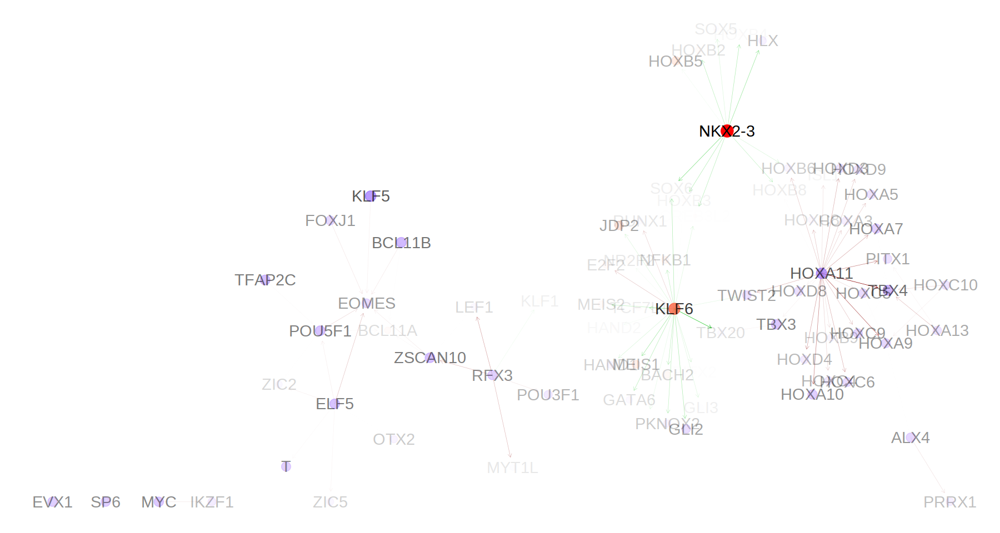

In [76]:
options(repr.plot.width=15, repr.plot.height=8)
 
ggraph(igraph.tbl, 'stress') +
    # Edges
    geom_edge_link(aes(edge_alpha=weight, edge_colour=sign), edge_width=0.15, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm'), show.legend = T) +
    scale_edge_alpha_continuous(range=c(0,1)) +
  #  scale_edge_width_continuous(range=c(0,1)) +
    scale_edge_colour_manual(values=c("Positive"="#08c20e", "Negative"="darkred")) +
    # Nodes
    geom_node_point(aes(col=expr, size=abs(expr), alpha=abs(expr))) + #, size=14
    scale_colour_gradient2(low = "blue", mid='white', high = "red") +
    geom_node_text(aes(label=tf, size=1, alpha=abs(expr))) + # , size=3.75
    scale_alpha_continuous(range=c(0.0,1)) +
    # theme
    theme_graph() + theme(
      legend.position = "none"
    )

#### Graph umap

In [193]:
library(uwot)

Loading required package: Matrix


Attaching package: ‘Matrix’


The following object is masked from ‘package:S4Vectors’:

    expand




In [194]:
as.matrix(igraph.net)

IGRAPH b104c90 DNW- 399 5274 -- 
+ attr: name (v/c), weight (e/n)
+ edges from b104c90 (vertex names):
 [1] ATF3  ->HMGA2   ESX1  ->HMGA2   FOXA3 ->HMGA2   FOXO4 ->HMGA2  
 [5] FOXP2 ->HMGA2   GATA3 ->HMGA2   GLI1  ->HMGA2   GLI2  ->HMGA2  
 [9] GLI3  ->HMGA2   HOXA4 ->HMGA2   HOXB3 ->HMGA2   HOXC10->HMGA2  
[13] HOXC5 ->HMGA2   HOXC6 ->HMGA2   HOXD9 ->HMGA2   KLF12 ->HMGA2  
[17] KLF5  ->HMGA2   MLXIPL->HMGA2   TEAD1 ->HMGA2   TFEB  ->HMGA2  
[21] TFEC  ->HMGA2   AIRE  ->ID2     HLTF  ->ID2     ID1   ->ID2    
[25] ID3   ->ID2     SNAI3 ->ID2     ZBTB7B->ID2     AIRE  ->TFCP2L1
[29] ARID3C->TFCP2L1 CEBPB ->TFCP2L1 ELF5  ->TFCP2L1 ESRRA ->TFCP2L1
+ ... omitted several edges

In [195]:
test = edge_list.dt %>% dcast(from~to, value.var="weight", fill=0, drop=F) %>%
    as.data.frame(.) %>% 
    tibble::column_to_rownames('from')

In [196]:
test2 = umap(test, n_neighbors =10) %>% 
    as.data.table(., keep.rownames=T) %>%
    setnames(c('gene', 'umap1', 'umap2'))

In [197]:
test2 = merge(test2, as.data.table(rna_tf_pseudobulk_scaled.mtx,keep.rownames=T), by.x='gene', by.y='rn')

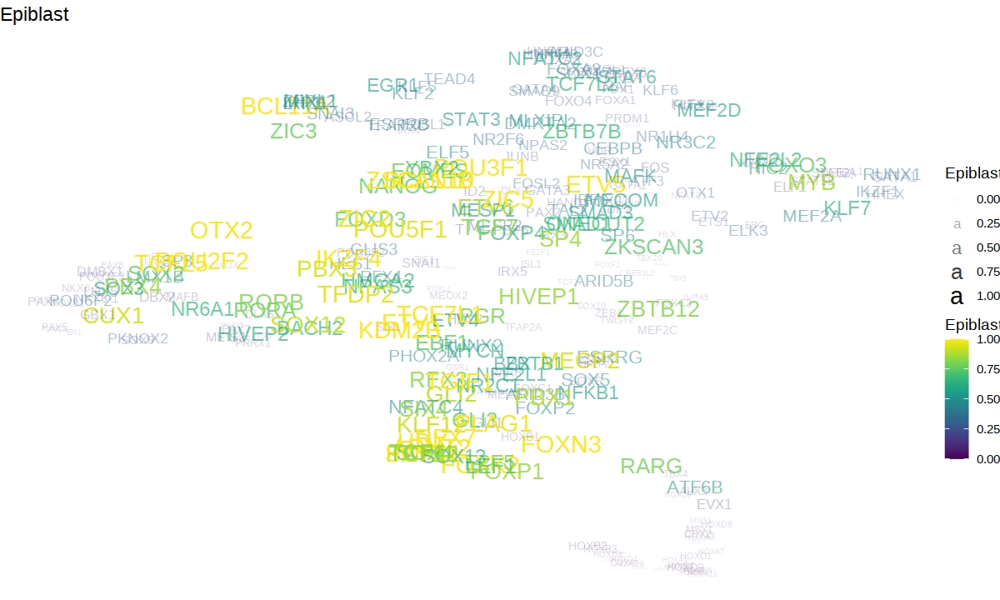

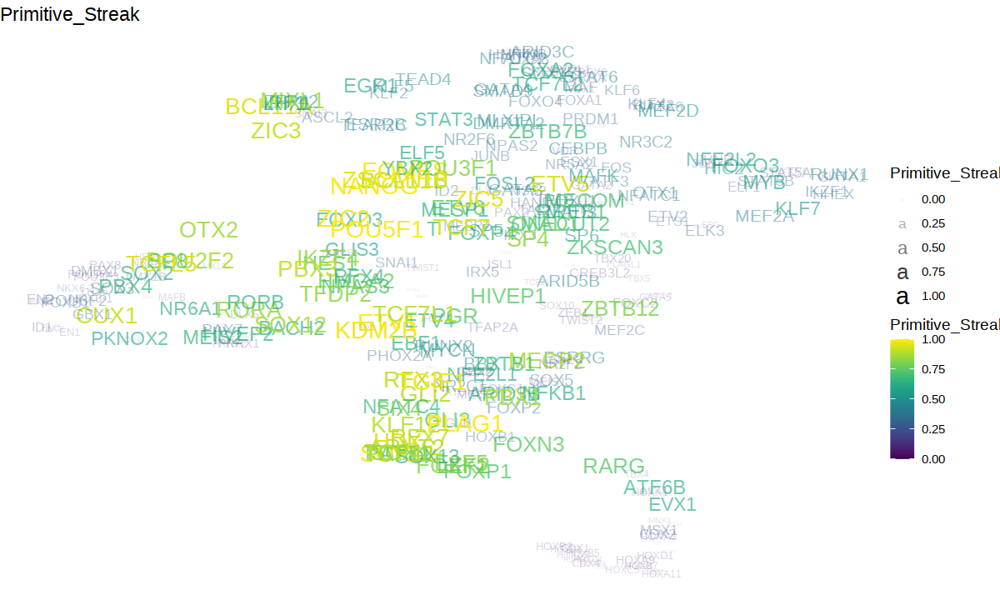

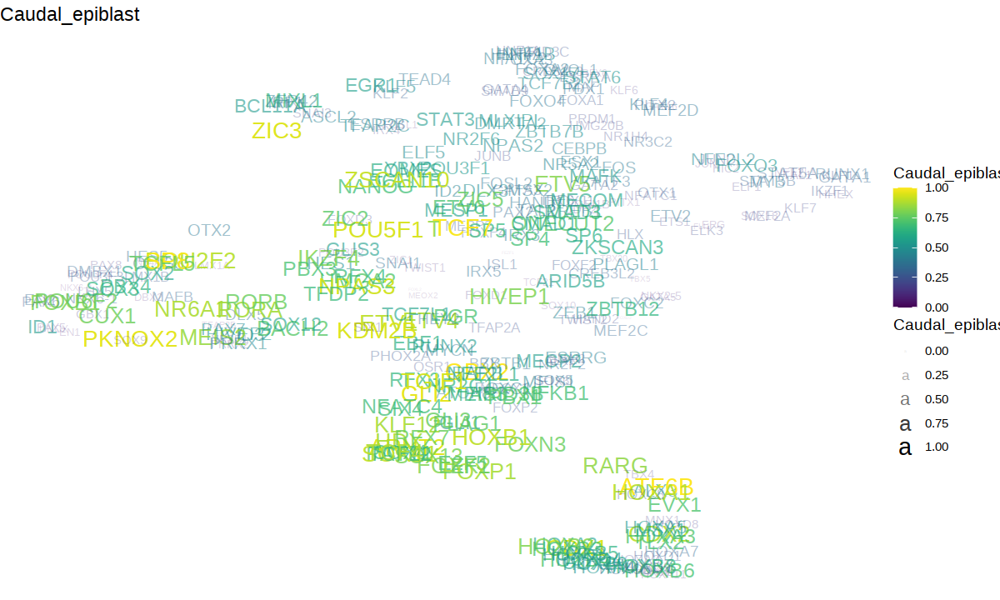

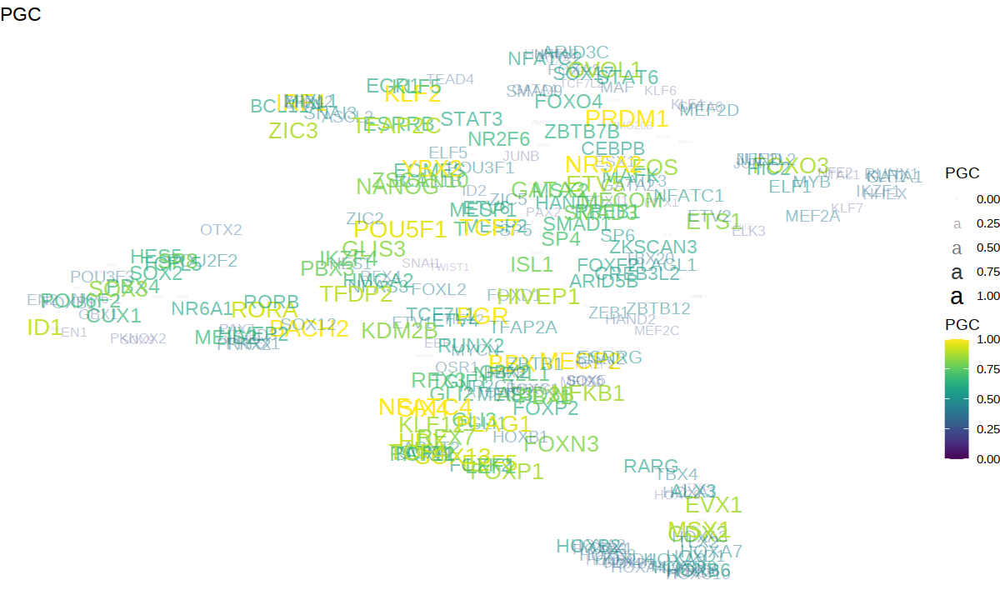

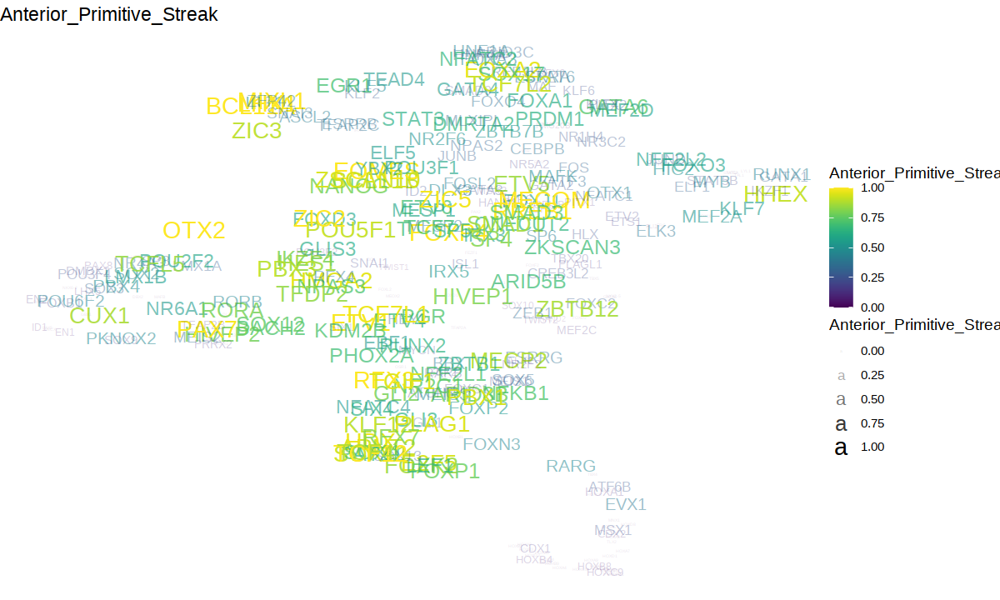

...

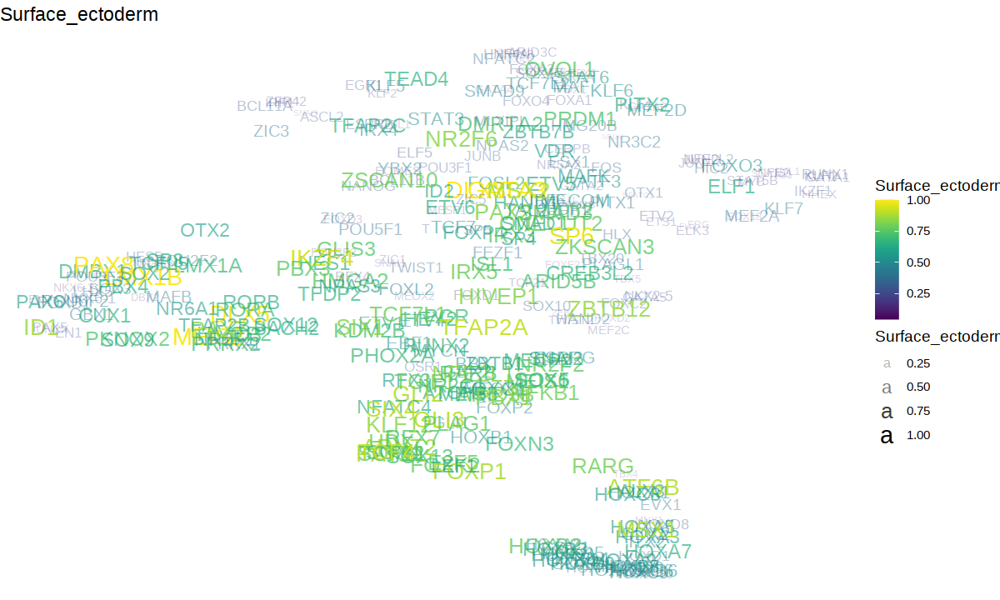

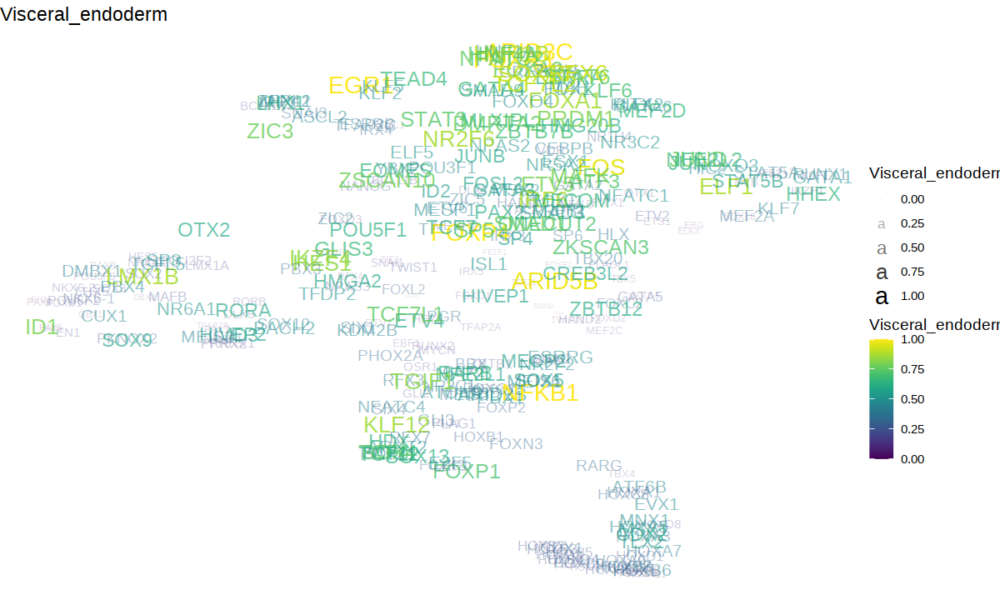

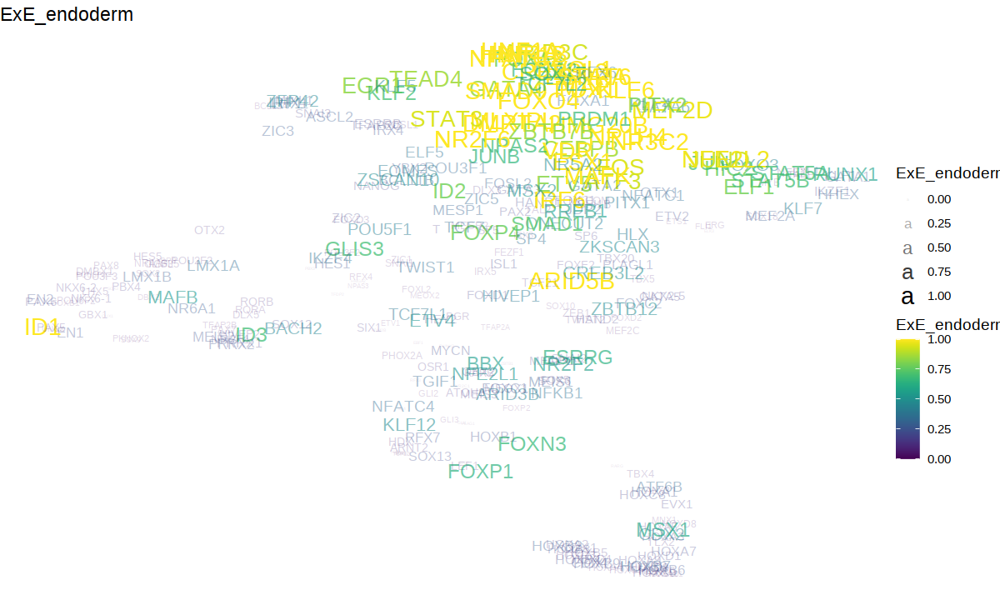

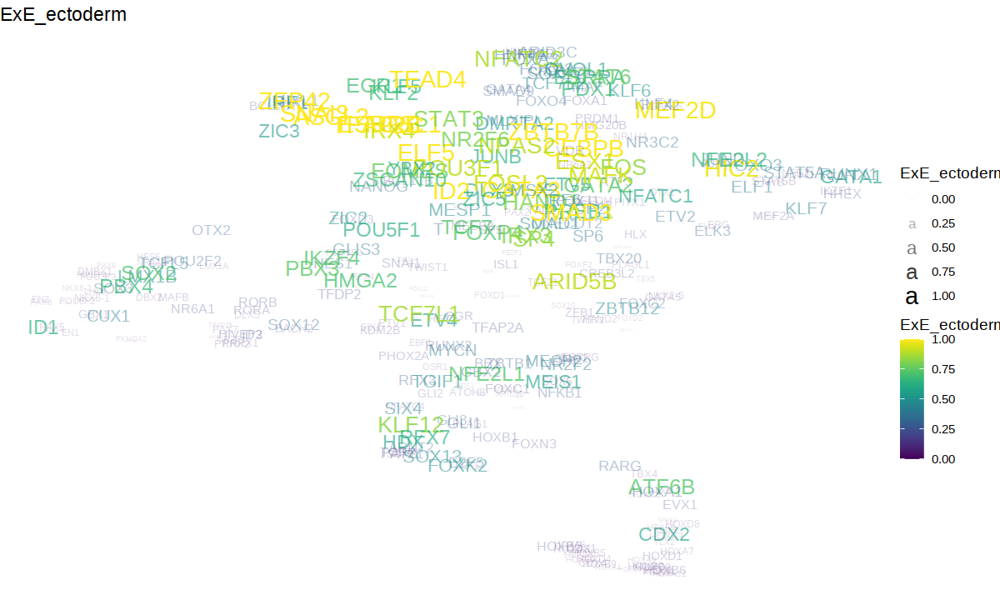

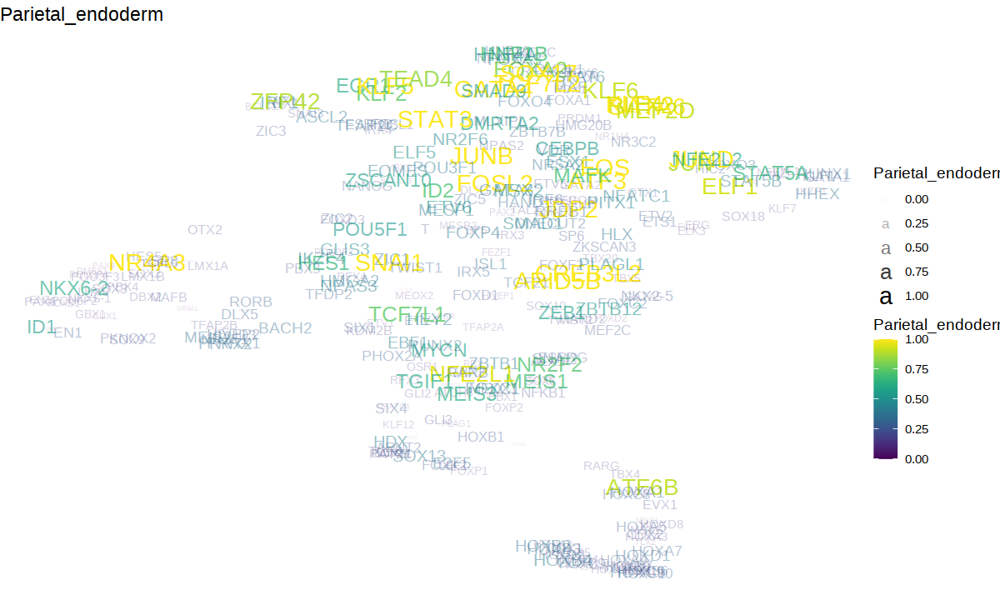

In [198]:
options(repr.plot.width=10, repr.plot.height=6)
for(i in colnames(rna_tf_pseudobulk_scaled.mtx)){
    p = ggplot(test2, aes_string('umap1', 'umap2', label='gene', col=i, alpha=i,size=i)) + 
        geom_text() + 
        viridis::scale_color_viridis() + 
        ggtitle(i) + 
        theme_void()
    print(p)
}

In [77]:
marker_TFs_filt.dt <- marker_TFs_all.dt %>% 
  .[score>=opts$min_tf_score]

In [78]:
test3 = test2[gene %in% marker_TFs_filt.dt$gene]

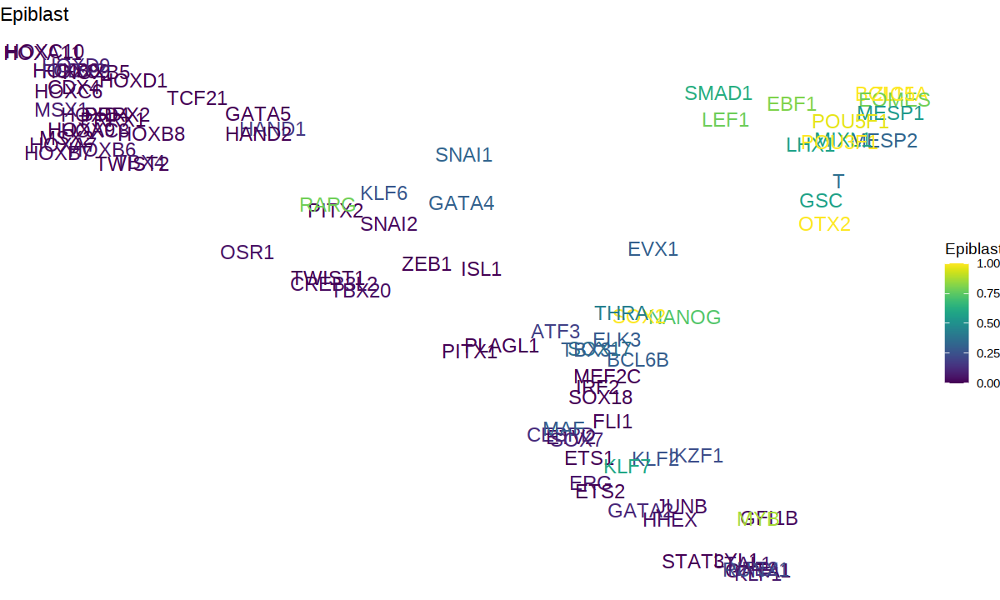

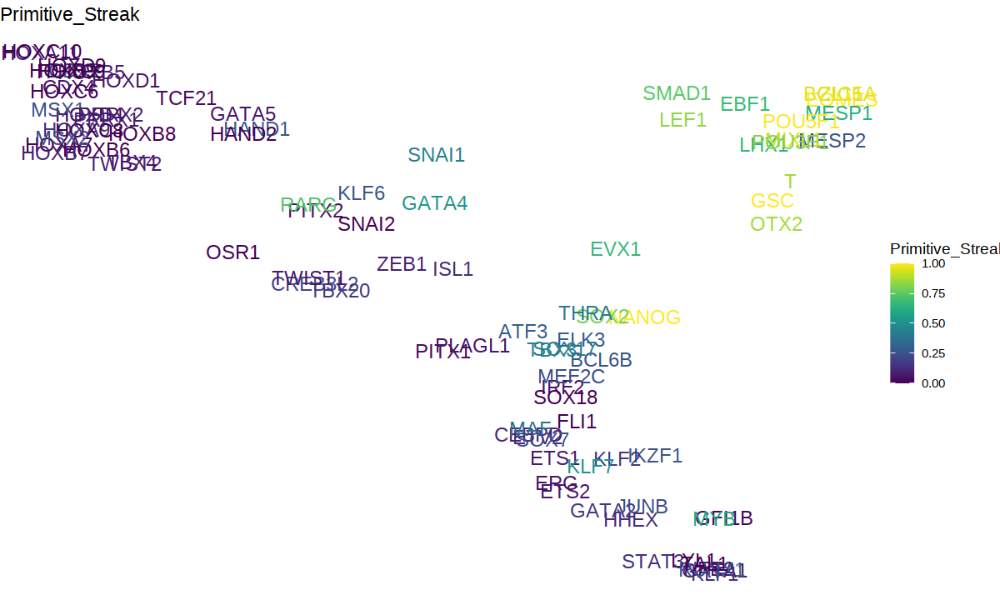

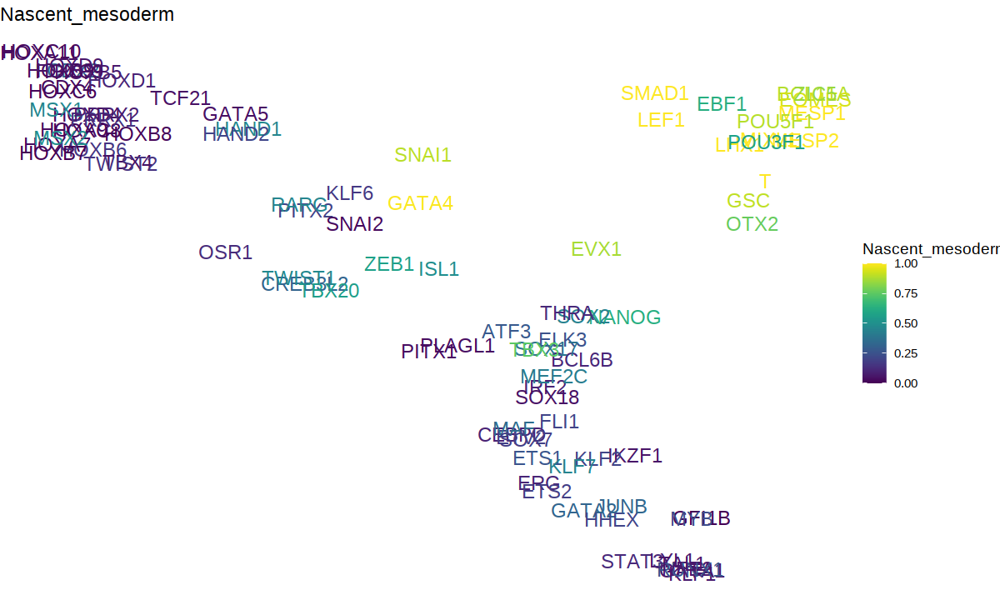

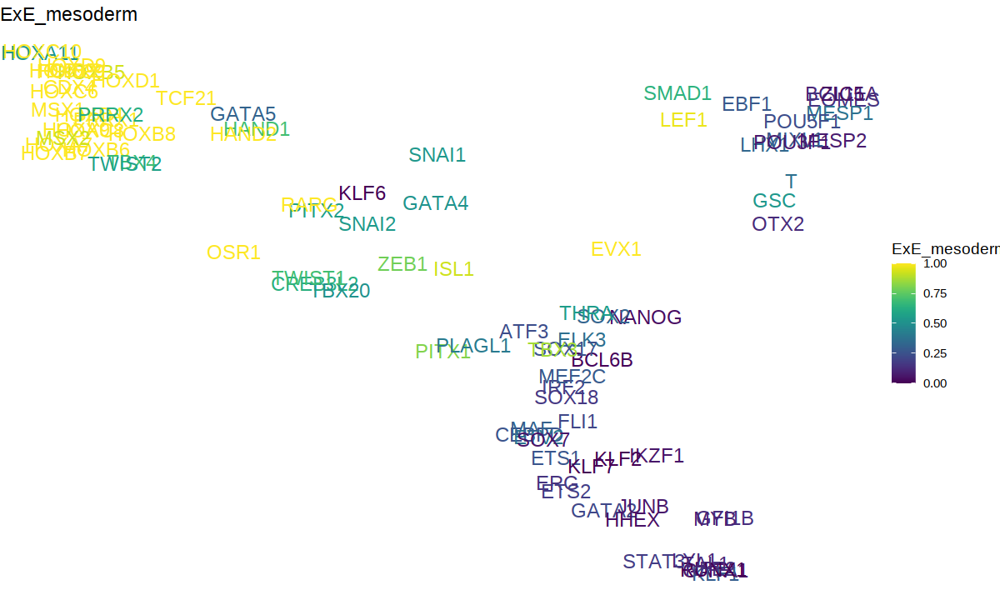

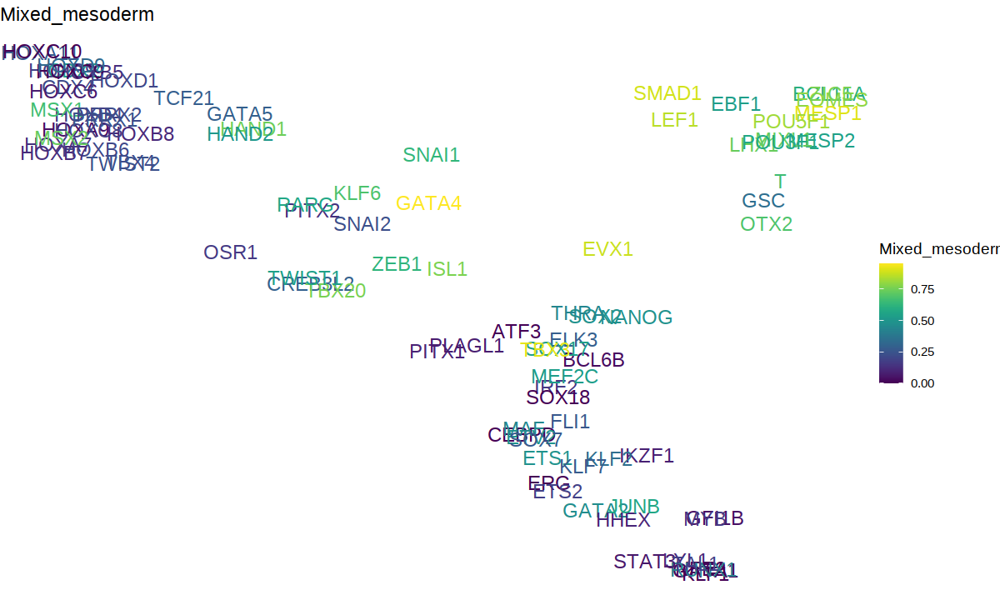

...

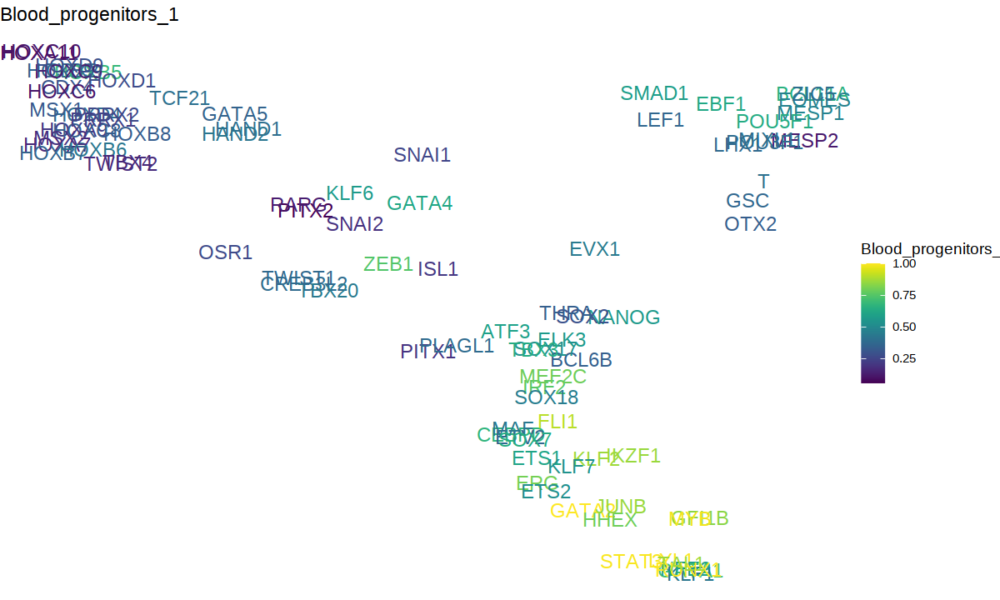

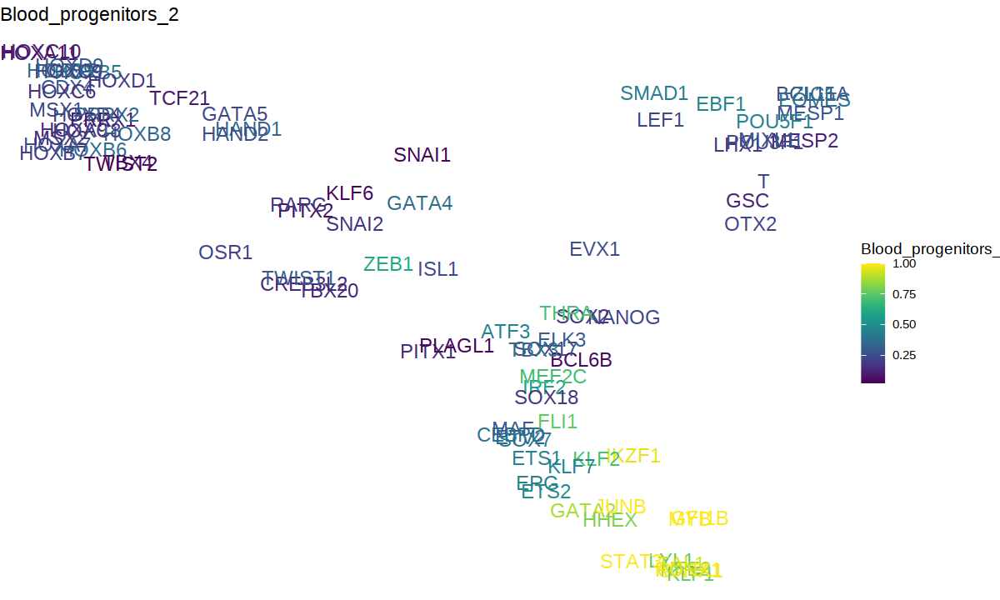

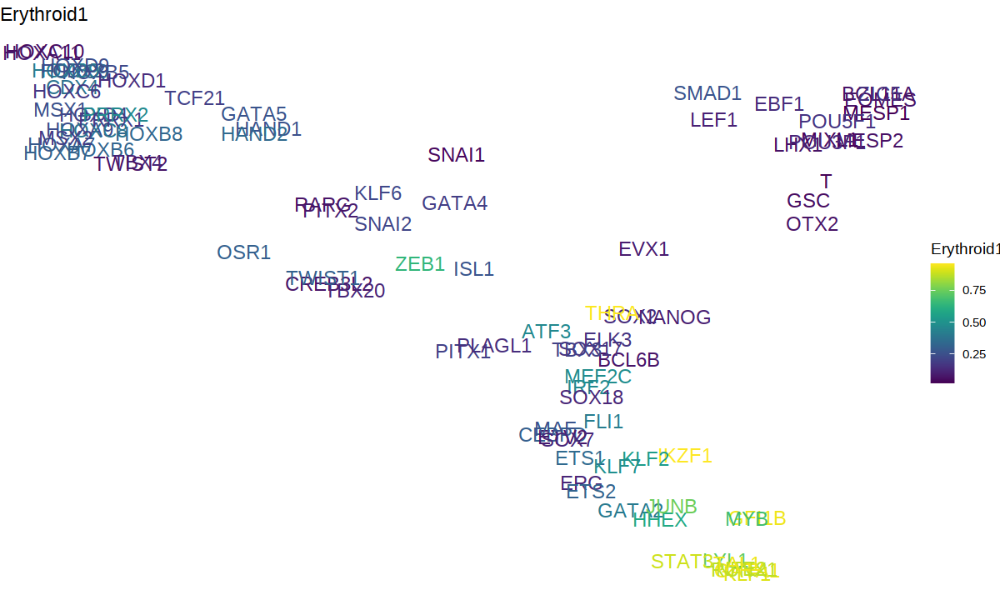

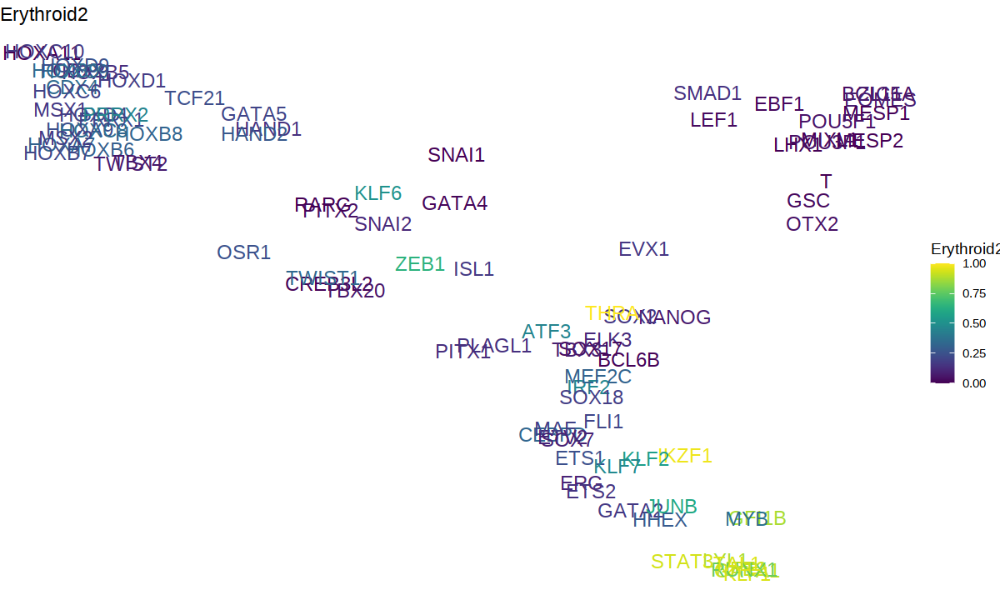

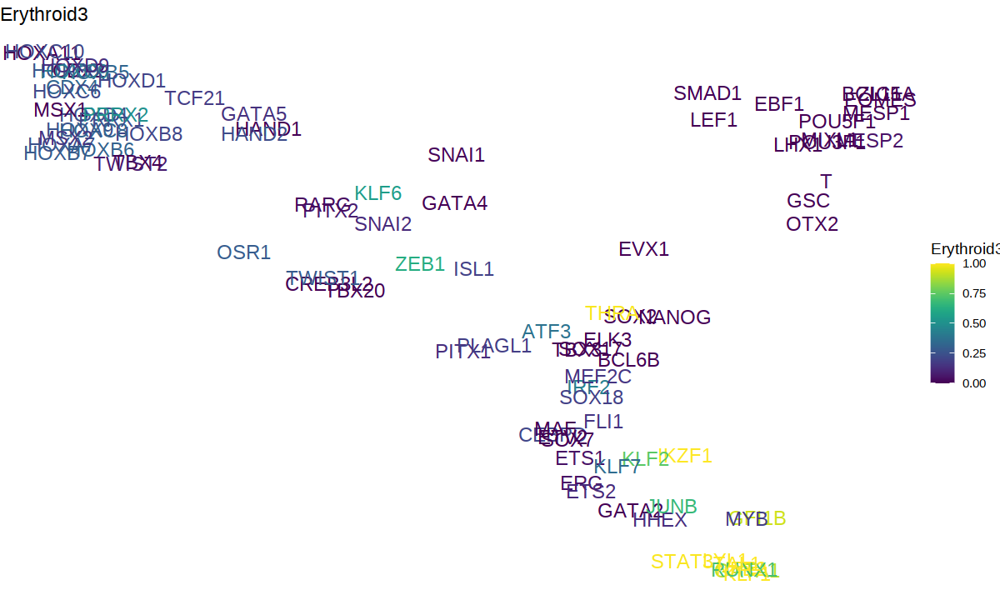

In [79]:
options(repr.plot.width=10, repr.plot.height=6)
for(i in colnames(rna_tf_pseudobulk_scaled.mtx)){
    p = ggplot(test3, aes_string('umap1', 'umap2', label='gene', col=i)) + 
        geom_text(size=5) + 
        viridis::scale_color_viridis() + 
        ggtitle(i) + 
        theme_void()
    print(p)
}

# investigate target genes

In [199]:
##################################
## Load global GRN coefficients ##
##################################

GRN_coef.dt <- fread(io$grn_coef) %>% 
  .[,gene:=toupper(gene)] %>% 
  .[pvalue<0.05 & abs(beta)>=opts$min_coef]

In [200]:
blood_tfs = c('LYL1', 'TAL1', 'KLF1', 'GATA1', 'GATA2', 'RUNX1', 'ELF1', 'STAT3')

In [201]:
targets = blood_tfs %>% map(function(x){
    tmp = GRN_coef.dt[tf==x]
    }) %>% rbindlist() %>%
    .[beta>0]

In [202]:
# Create igraph object
igraph.net <- graph_from_data_frame(d = targets)

# Create tbl_graph object for ggraph
igraph.tbl <- as_tbl_graph(igraph.net) 

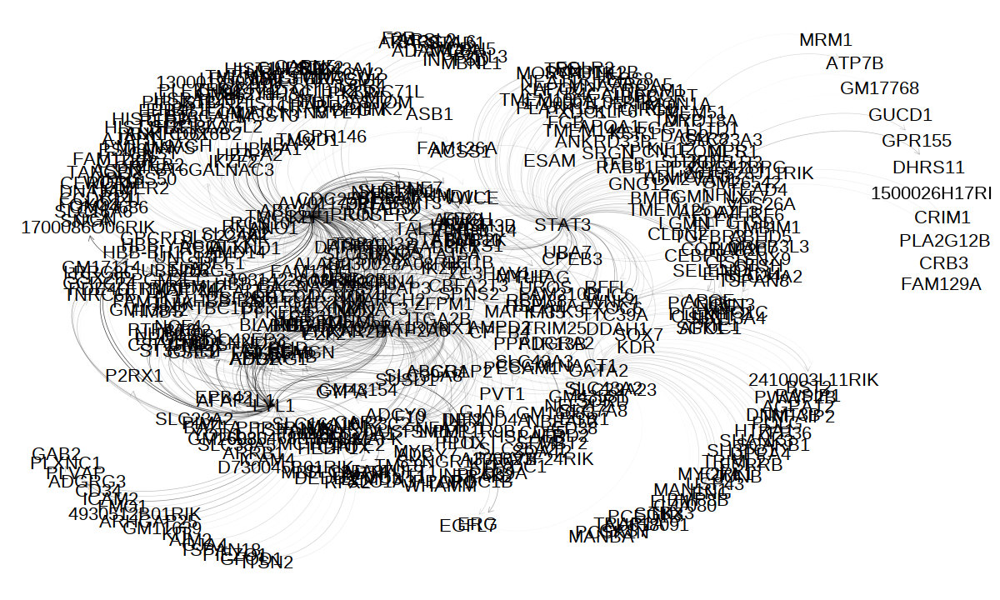

In [203]:
ggraph(igraph.tbl, 'stress') +
    # Edges
    geom_edge_arc(aes(edge_alpha=beta), edge_width=0.15, arrow=arrow(length=unit(1.5,'mm')), end_cap=circle(4,'mm'), show.legend = T) +
    scale_edge_alpha_continuous(range=c(0,1)) +
    # Nodes
   # geom_node_point(aes(size=14)) + #, size=14
    geom_node_text(aes(label=name, size=1)) + # , size=3.75
    scale_alpha_continuous(range=c(0.0,1)) +
    # theme
    theme_graph() + theme(
      legend.position = "none"
    )

In [ ]:
#Gene ontology corresponds to oxygen transport, erythrocyte differentiation etc, so as expected

[1] "PLXNC1"        "DDAH1"         "CBFA2T3"       "ITGB3"        
  [5] "ZFPM1"         "IKZF1"         "STAT3"         "ABCG1"        
  [9] "RUNX1"         "ADGRG1"        "MIR142HG"      "ATXN1"        
 [13] "6030468B19RIK" "HBA-X"         "HBA-A1"        "HBA-A2"       
 [17] "ZDHHC14"       "EPB41"         "HBB-BS"        "HBB-BH2"      
 [21] "HBB-BH1"       "HBB-Y"         "NOTCH3"        "GFI1B"        
 [25] "EPOR"          "RAB3IL1"       "RBM38"         "STAT5B"       
 [29] "UNC13D"        "SLC6A9"        "STAT5A"        "ITGA2B"       
 [33] "SPEF1"         "CPEB4"         "ATP2A3"        "UBASH3B"      
 [37] "SPNS2"         "SAMD14"        "GM26885"       "ARHGEF10L"    
 [41] "ANO1"          "CLMP"          "GATA1"         "PRKCA"        
 [45] "E2F2"          "RGS10"         "PLEKHG3"       "SPTB"         
 [49] "CAR2"          "RHD"           "LRRC8B"        "PRKAR2B"      
 [53] "MYLIP"         "TMEM56"        "BACH2"         "BMP2K"        
 [57] "GM43154"       "HBB-BT"        "PLEKHG2"       "NFATC1"       
 [61] "EXOC6"         "GATA2"         "SCUBE2"        "HK1"          
 [65] "SLC29A1"       "FERMT3"        "EPB42"         "ARHGEF17"     
 [69] "SMOX"          "CSF2RB"        "KCNN4"         "TBC1D8"       
 [73] "GM17114"       "CDC25B"        "SLA2"          "NDRG3"        
 [77] "GYPC"          "P2RX1"         "SLC4A1"        "AMPD2"        
 [81] "SLC18A2"       "SLC30A10"      "TMC6"          "PIGL"         
 [85] "BLVRB"         "PTPRE"         "DAPP1"         "TAL1"         
 [89] "TMOD1"         "TSPAN32"       "AQP8"          "SDK2"         
 [93] "TNS1"          "CCDC32"        "PLXND1"        "STON2"        
 [97] "CITED4"        "GPRC5C"        "BTG2"          "PTPN14"       
[101] "LRRC8C"        "COL1A1"        "FAM110C"       "MARCH2"       
[105] "ZBTB46"        "SLC39A8"       "ABCB10"        "ZFP423"       
[109] "BRSK1"         "DAB2IP"        "SELENON"       "AW011738"     
[113] "TSPAN33"       "GAB2"          "NRIP3"         "TRIM17"       
[117] "AFAP1L1"       "PTP4A3"        "FTH1"          "GMPR"         
[121] "ATP8A1"        "RFX2"          "STEAP3"        "SESTD1"       
[125] "EPHB4"         "MICALL2"       "WDR91"         "RPIA"         
[129] "SYNGR1"        "HEMGN"         "ACHE"          "UFSP1"        
[133] "CPOX"          "IKZF2"         "ZC3HAV1"       "INA"          
[137] "UBA7"          "HHEX"          "MGST3"         "CCDC92B"      
[141] "TARSL2"        "HSPA1A"        "TMEM14C"       "TANC1"        
[145] "DHRS11"        "SLC16A10"      "TMC8"          "FECH"         
[149] "MYRF"          "VWCE"          "GGTA1"         "ST6GALNAC3"   
[153] "D030028A08RIK" "TNFAIP2"       "1700025G04RIK" "ZFP618"       
[157] "NMNAT3"        "PNPO"          "LMO2"          "4931422A03RIK"
[161] "MBNL1"         "PHLDA1"        "ALAS2"         "RAB30"        
[165] "SUSD1"         "SLC14A1"       "ITGA3"         "FAM210B"      
[169] "TNIK"          "MKNK1"         "RELN"          "GM13842"      
[173] "MFSD2B"        "UROS"          "DAAM2"         "ADAM19"       
[177] "SPECC1"        "PPP1R9B"       "TRIO"          "NUP210"       
[181] "CAPN5"         "ZFHX3"         "LYL1"          "SMAD6"        
[185] "NCKAP5"        "CITED2"        "AKAP12"        "AFF3"         
[189] "ADD2"          "BCAM"          "JOSD2"         "IFI35"        
[193] "VAT1"          "TRIM25"        "ELL2"          "RARG"         
[197] "PRDX3"         "RBMS1"         "APBB2"         "ART4"         
[201] "CDC42EP3"      "MCC"           "EPHA1"         "PECAM1"       
[205] "STX2"          "HIST3H2A"      "UBE2L6"        "SLC43A1"      
[209] "PROKR1"        "GYPA"          "FXYD6"         "SYNE2"        
[213] "MXRA8"         "GPR146"        "LAMA5"         "TREML2"       
[217] "GPCPD1"        "TBC1D24"       "CCDC24"        "ERAL1"        
[221] "SSX2IP"        "RNF123"        "SSBP4"         "CSF2RB2"      
[225] "TEK"           "ITSN2"         "NCF4"          "SEPT10"       
[229] "SLC25

In [118]:
 head(GRN_coef.dt[tf=='ARID3A' & beta> 0] %>% .[order(-beta),gene], 100)

[1] "HBB-BH1"       "HBA-X"         "HBB-Y"         "HBA-A1"       
  [5] "DLK1"          "HBA-A2"        "AIRN"          "HAPLN1"       
  [9] "AHNAK"         "ADGRA2"        "ARID3A"        "COL1A1"       
 [13] "MIR142HG"      "CREG1"         "DPF3"          "ANO1"         
 [17] "GADD45G"       "POPDC2"        "ABCB10"        "TMEM56"       
 [21] "ART4"          "ZDHHC14"       "CCDC80"        "TMC6"         
 [25] "PRDM6"         "PRKAR2B"       "6530409C15RIK" "HBB-BS"       
 [29] "EMILIN2"       "SMPD1"         "SPTB"          "PPIC"         
 [33] "PON2"          "HOXB2"         "TRIM10"        "GGTA1"        
 [37] "GM26827"       "TMEM258"       "CSRP1"         "SIAH2"        
 [41] "PFKFB4"        "BMP4"          "IGF2R"         "SAMD14"       
 [45] "PLVAP"         "GM29585"       "MRAP"          "DAD1"         
 [49] "HOXB3OS"       "6030468B19RIK" "RDM1"          "INF2"         
 [53] "FECH"          "UBASH3B"       "VEGFA"         "SERINC3"      
 [57] "HBB-BT"        "H19"           "EMP3"          "FLNC"         
 [61] "ABCA3"         "POFUT2"        "POP5"          "DPM2"         
 [65] "S100A1"        "TMX1"          "SKAP1"         "SLC39A8"      
 [69] "GAB1"          "CITED2"        "WDR83OS"       "MRPS24"       
 [73] "SH2B3"         "RCN3"          "PIP5K1B"       "CNPPD1"       
 [77] "ISCA2"         "PPP1R9B"       "FBN1"          "MYDGF"        
 [81] "DDIT3"         "MARCH2"        "CMTM7"         "OGFOD3"       
 [85] "PON3"          "ZFP800"        "CPED1"         "RARB"         
 [89] "4930512B01RIK" "RUBIE"         "GM43154"       "RPL29"        
 [93] "GM26885"       "MRPS36"        "LRRC39"        "NSMAF"        
 [97] "LSP1"          "FAM122A"       "HSCB"          "ZBTB46"